# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

In [6]:
class Identity(nn.Module):
    def forward(self, x):
        return x

### ResNet18-LSTM

In [7]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        resnet18.fc = Identity()
        
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder
        self.cnn = resnet18
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [8]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        resnet50.fc = Identity()
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet50
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [9]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        resnet101.fc = Identity()
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet101
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [10]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet121.classifier.in_features
        
        densenet121.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet121
        
        for param in densenet121.parameters():
            param.requires_grad = False
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [11]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet169.classifier.in_features
        
        densenet169.classifier = Identity()
        
        for param in densenet169.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet169
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [12]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet201.classifier.in_features
        
        densenet201.classifier = Identity()
        
        for param in densenet201.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet201
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [13]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
        vgg11bn.classifier[6] = Identity()
        
        for param in vgg11bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [14]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        vgg16bn.classifier[6] = Identity()
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [15]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        vgg19bn.classifier[6] = Identity()
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [16]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [17]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 0

In [18]:
resnet18LSTM_500_1_0 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet50LSTM_500_1_0 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet101LSTM_500_1_0 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

densenet121LSTM_500_1_0 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet169LSTM_500_1_0 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet201LSTM_500_1_0 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

vgg11bnLSTM_500_1_0 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg16bnLSTM_500_1_0 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg19bnLSTM_500_1_0 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [19]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0244 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0949 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1086 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1115 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0843 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0947 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0131 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

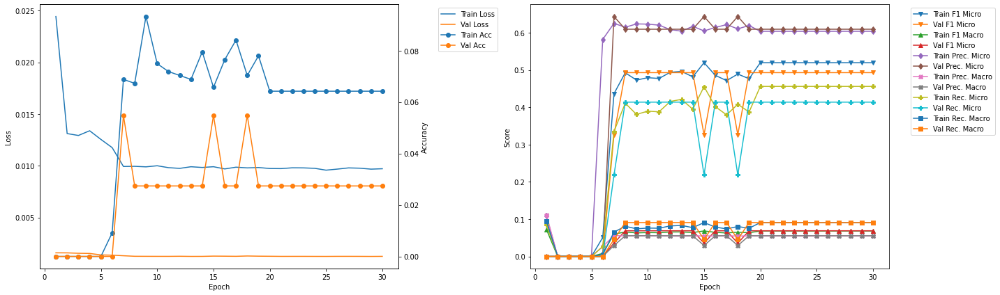

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.93
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0585 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0195 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3957 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0934 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0316 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0116 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.06
Train Loss: 0.0118 	Validation Loss: 0.0013
Train Accuracy: 0.0382 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1542 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0231 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6638 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0562 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0873 	Validation Recall Micro: 0.0
Train

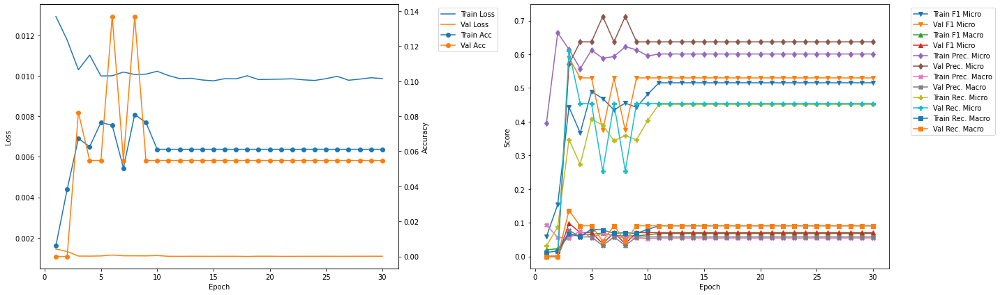

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.69
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4604 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0623 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6125 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3688 	Validation Recall Micro: 0.4579
Train Recall Marco: 0.0729 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.81
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4203 	Validation F1 Micro: 0.3726
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5873 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0572 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.3273 

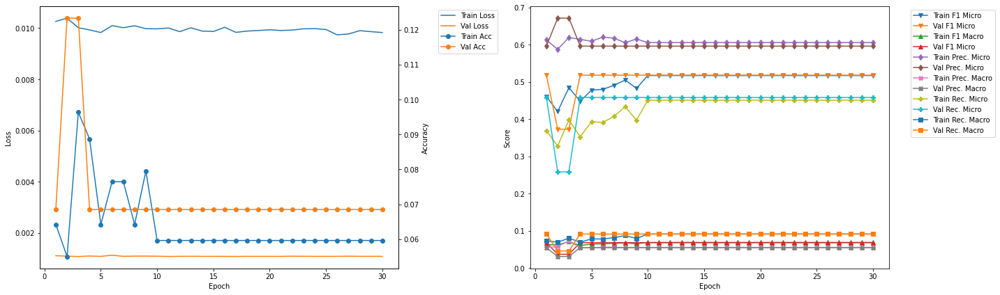

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.45
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6113 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0683 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3764 	Validation Recall Micro: 0.4574
Train Recall Marco: 0.0748 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.58
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5091 	Validation F1 Micro: 0.3448
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.436 	

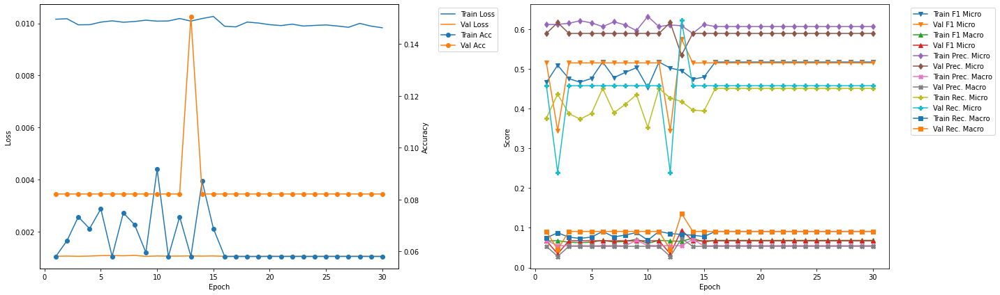

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.21
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.493 	Validation F1 Micro: 0.5074
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4128 	Validation Recall Micro: 0.4456
Train Recall Marco: 0.0821 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.34
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5074
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4521 	Valid

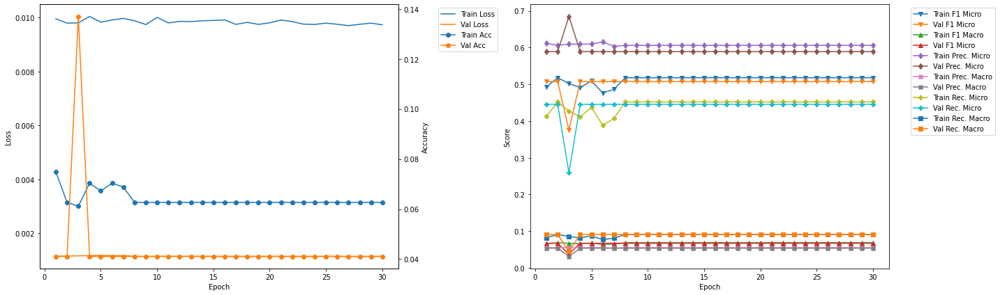

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.98
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6172 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3828 	Validation Recall Micro: 0.43
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.1
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5084 	Validation F1 Micro: 0.35
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4374 	Valid

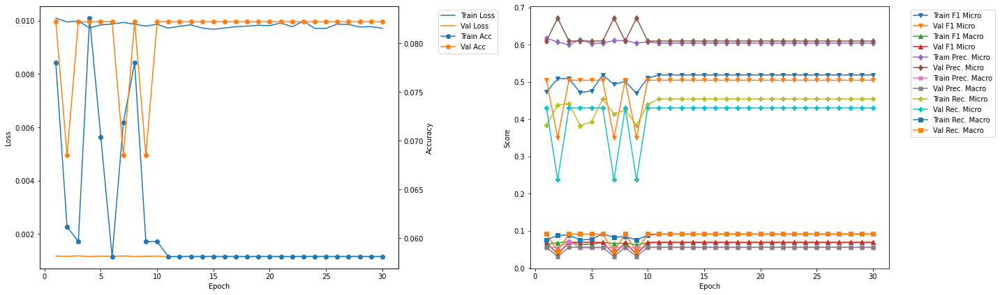

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.75
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0826 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4867 	Validation F1 Micro: 0.5243
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0689 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4013 	Validation Recall Micro: 0.4969
Train Recall Marco: 0.081 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.87
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4709 	Validation F1 Micro: 0.5243
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3784 

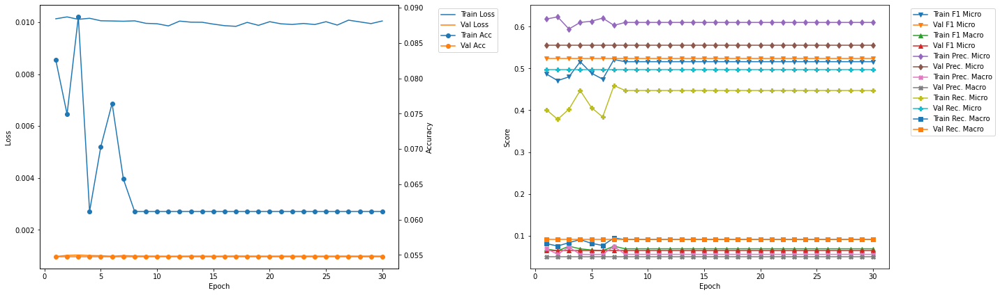

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.51
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.4871
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6039 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4455 	Validation Recall Micro: 0.4146
Train Recall Marco: 0.0886 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.63
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.4871
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.45

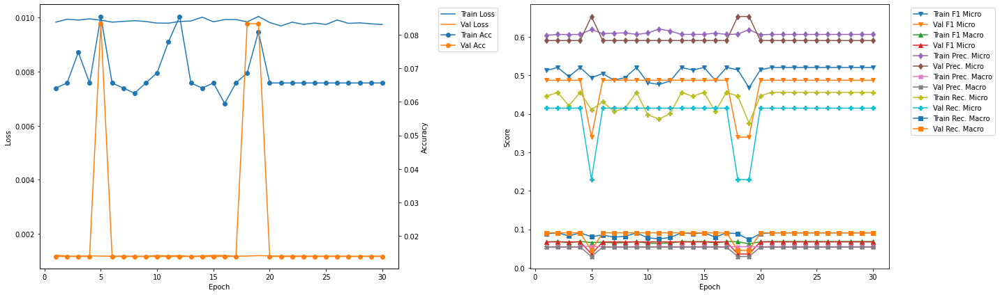

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.28
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4796 	Validation F1 Micro: 0.5647
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5941 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0682 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4021 	Validation Recall Micro: 0.4898
Train Recall Marco: 0.081 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.41
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.3731
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.5944 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.426 	V

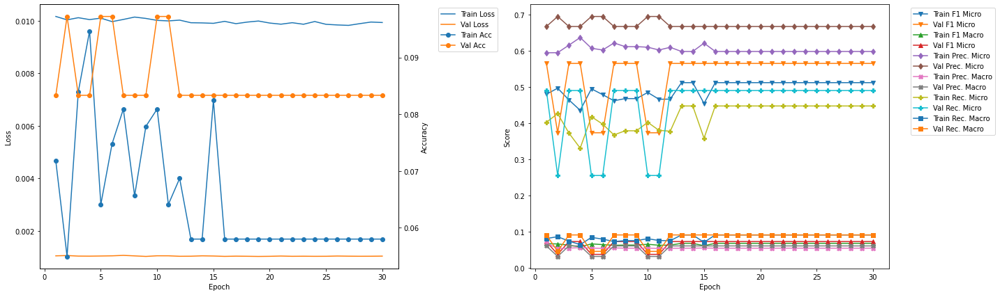

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.05
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5192 	Validation F1 Micro: 0.5289
Train F1 Marco: 0.0781 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.5899 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4637 	Validation Recall Micro: 0.4703
Train Recall Marco: 0.0962 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.17
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4875 	Validation F1 Micro: 0.3658
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.6156 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.4035 	Va

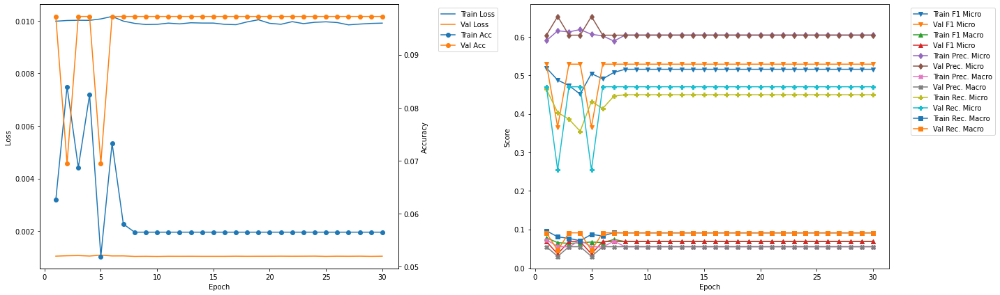

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 3
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4433 	Validation F1 Micro: 0.5896
Train F1 Marco: 0.0603 	Validation F1 Macro: 0.0982
Train Precision Mirco: 0.6144 	Validation Precision Micro: 0.5708
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0778
Train Recall Mirco: 0.3467 	Validation Recall Micro: 0.6098
Train Recall Marco: 0.0682 	Validation Recall Macro: 0.1364


In [20]:
resnet18LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.017 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0465 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0283 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1102 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1018 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0295 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0323 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

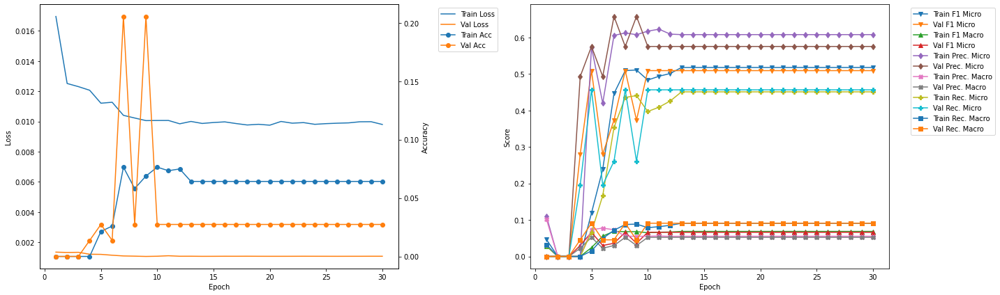

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.509091 --> 0.522989).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.37
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5099 	Validation F1 Micro: 0.523
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4424 	Validation Recall Micro: 0.4505
Train Recall Marco: 0.0888 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.51
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4638 	Validation F1 Micro: 0.523
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.5995 	Validation Precision Micro: 0.6233
Train Precisio

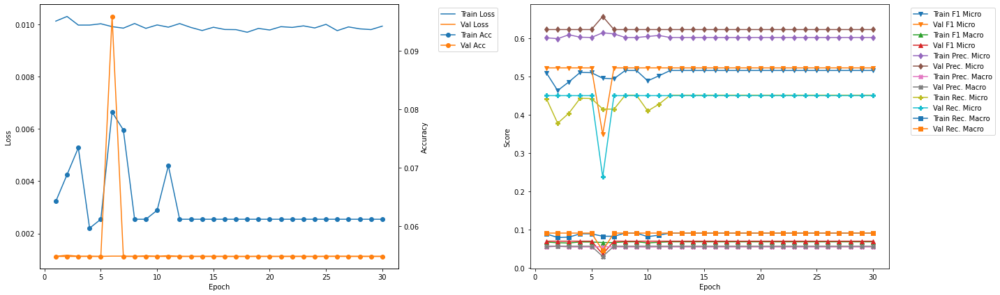

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.522989 --> 0.569697).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 8.6
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4738 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5976 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3925 	Validation Recall Micro: 0.5109
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.74
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0489 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5034 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.591 	Validation Precision Micro: 0.6438
Train Precision Ma

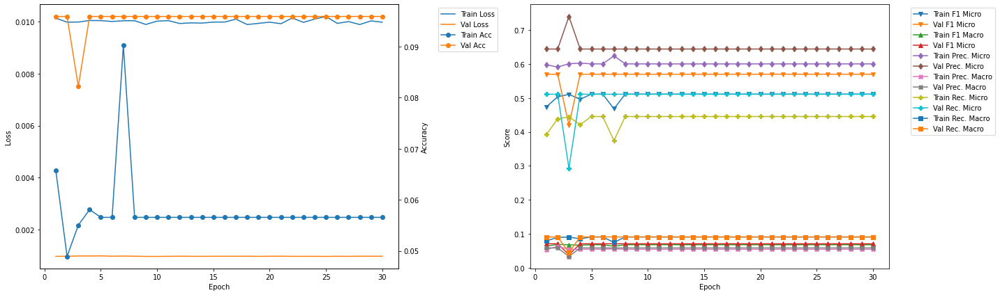

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.83
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4757 	Validation F1 Micro: 0.5314
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6037 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3924 	Validation Recall Micro: 0.4559
Train Recall Marco: 0.0778 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.97
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.3827
Train F1 Marco: 0.0769 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5865 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.4125 	V

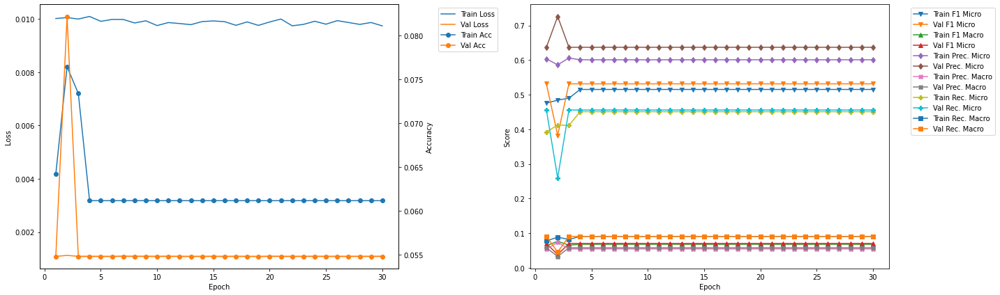

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.06
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4503 	Validation Recall Micro: 0.4629
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.2
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5176 	Validation F1 Micro: 0.3871
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.4492 

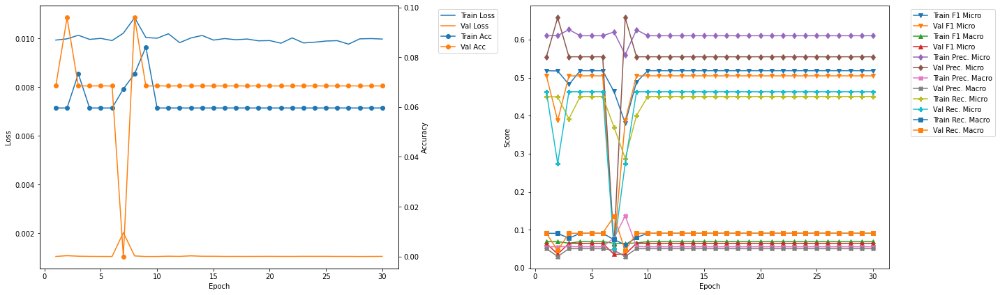

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.28
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.487
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4548 	Validation Recall Micro: 0.4221
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.43
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.487
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4548

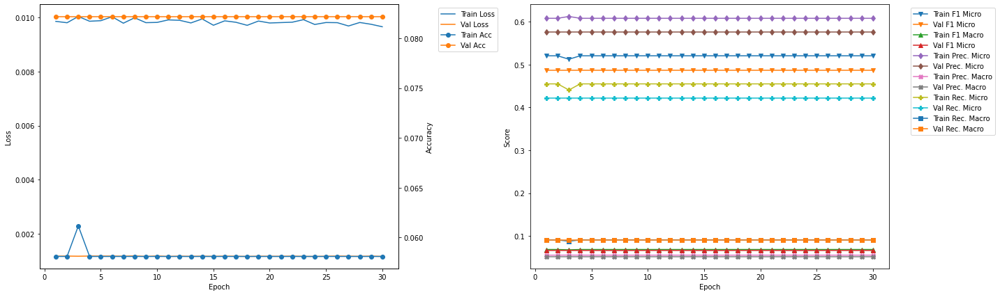

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.63
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4535 	Validation Recall Micro: 0.4337
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.77
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4954 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6068 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.418

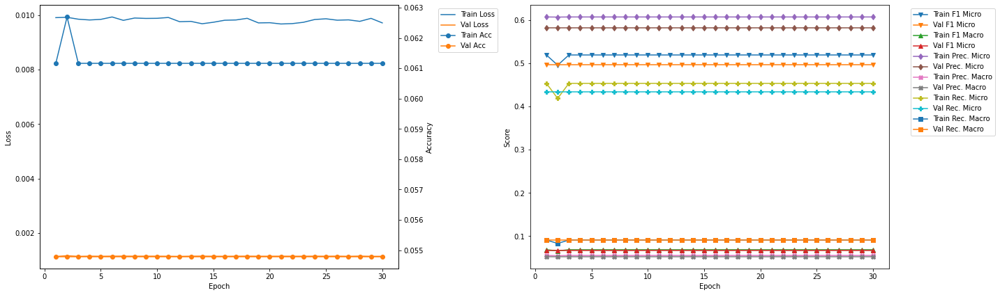

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.85
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4531 	Validation Recall Micro: 0.4372
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.99
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4531 	Va

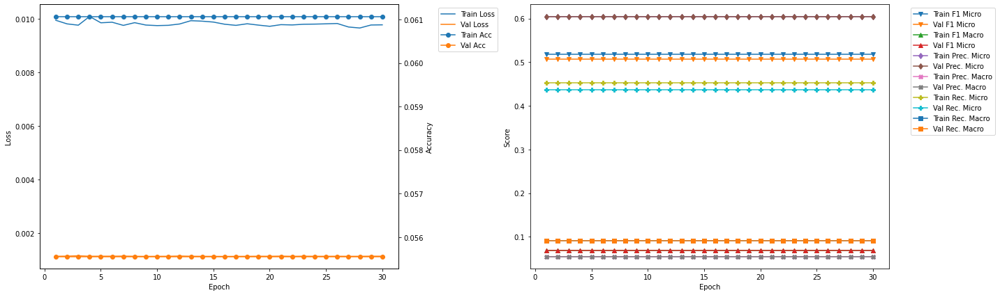

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.09
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5084 	Validation F1 Micro: 0.5242
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.442 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0886 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.23
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5161 	Validation F1 Micro: 0.5242
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4523

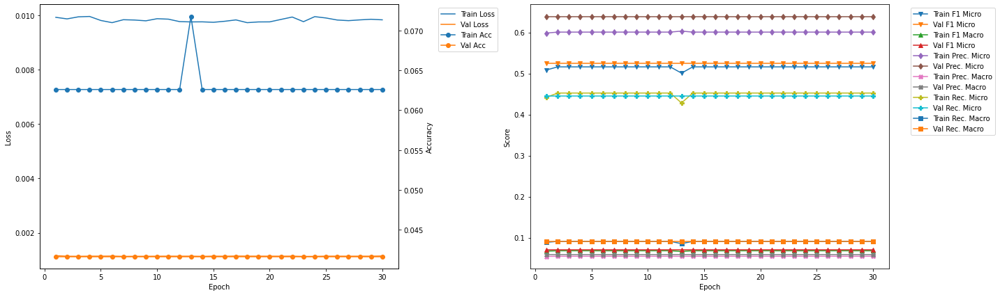

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.517 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.452 	Validation Recall Micro: 0.4467
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.45
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.517 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.452 	V

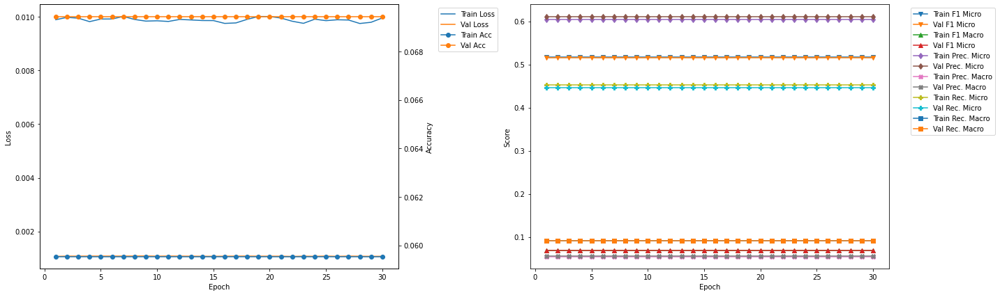

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4738 	Validation F1 Micro: 0.5697
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5976 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3925 	Validation Recall Micro: 0.5109
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.0909


In [21]:
resnet50LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0232 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0946 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0588 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1379 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1201 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.072 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0768 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

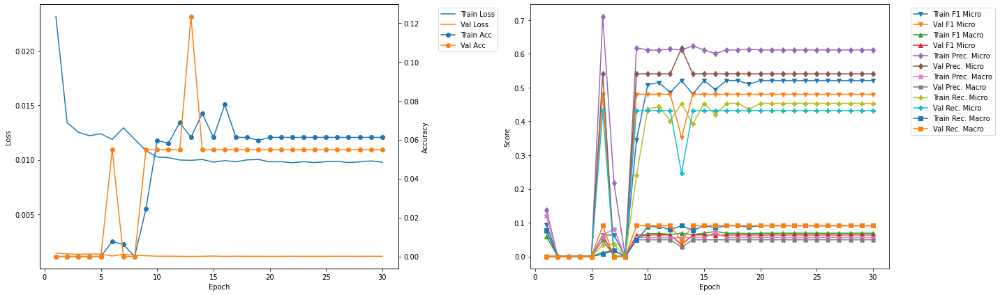

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.480243 --> 0.527221).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 4.96
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4732 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0714 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3922 	Validation Recall Micro: 0.4532
Train Recall Marco: 0.0793 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.12
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4945 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.6301
Train Precisio

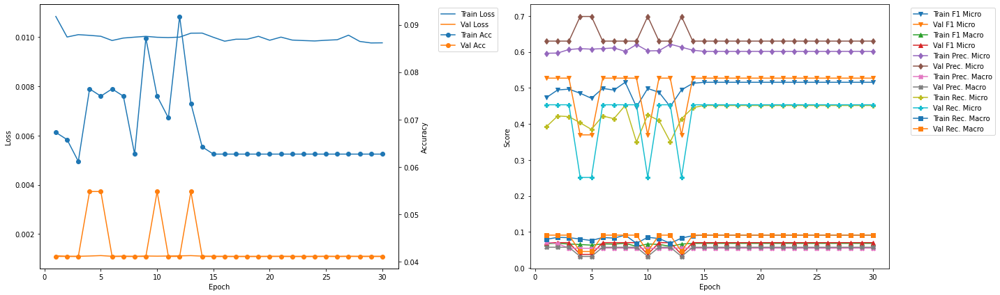

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.76
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4655 	Validation F1 Micro: 0.4909
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.5949 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0606 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3823 	Validation Recall Micro: 0.4402
Train Recall Marco: 0.0778 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.92
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.475 	Validation F1 Micro: 0.4909
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6333 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0562 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.38 	V

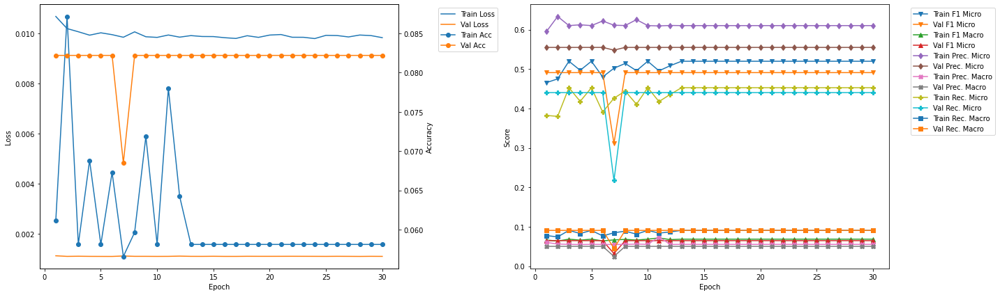

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.57
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.6035 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0711 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4182 	Validation Recall Micro: 0.4363
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.73
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4903 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.41

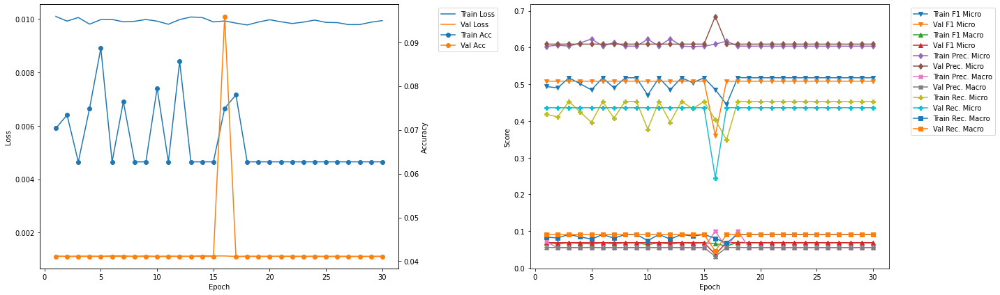

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.37
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4765 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3898 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.0768 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.52
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4202

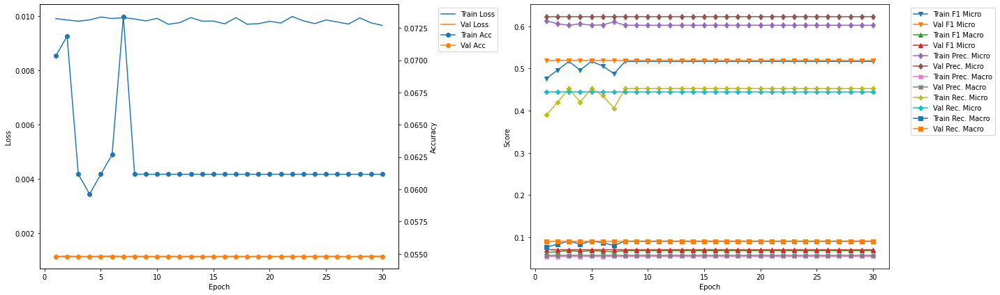

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.16
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.486 	Validation F1 Micro: 0.4629
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0631
Train Precision Mirco: 0.6282 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0562 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3964 	Validation Recall Micro: 0.4084
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.32
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5238 	Validation F1 Micro: 0.3333
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0702 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.460

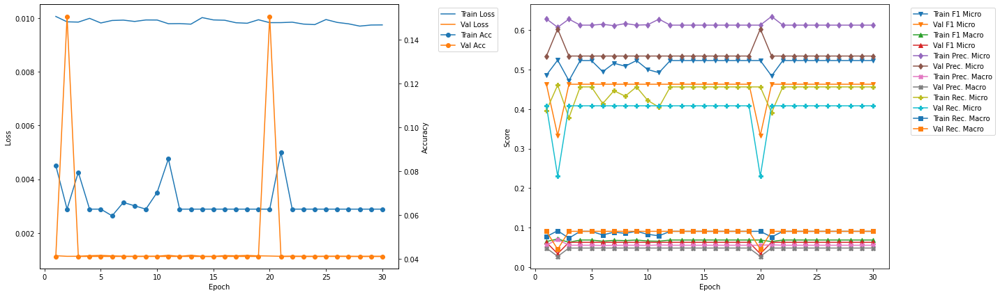

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.527221 --> 0.534819).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 28.96
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.5348
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4516 	Validation Recall Micro: 0.4507
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.12
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4915 	Validation F1 Micro: 0.5348
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5985 	Validation Precision Micro: 0.6575
Train Precisi

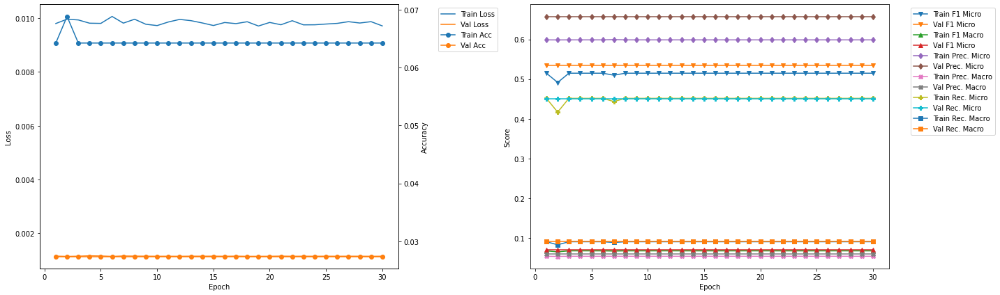

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.534819 --> 0.574850).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 33.77
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0504 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.5749
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4456 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.93
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.482 	Validation F1 Micro: 0.5749
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6667
Train Precision Mar

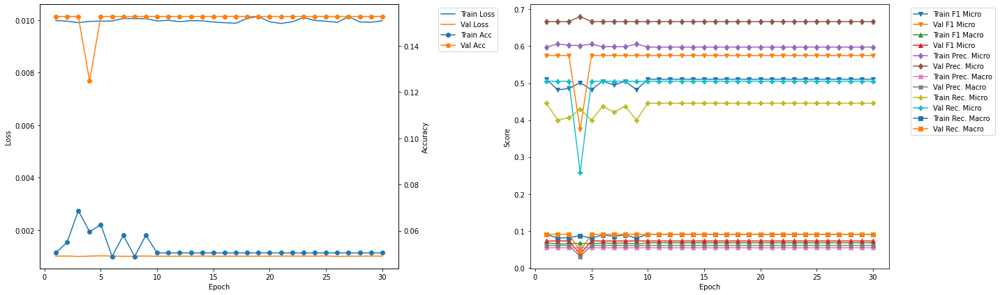

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.56
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5108 	Validation F1 Micro: 0.4969
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4414 	Validation Recall Micro: 0.4451
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.72
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.519 	Validation F1 Micro: 0.4969
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4521 

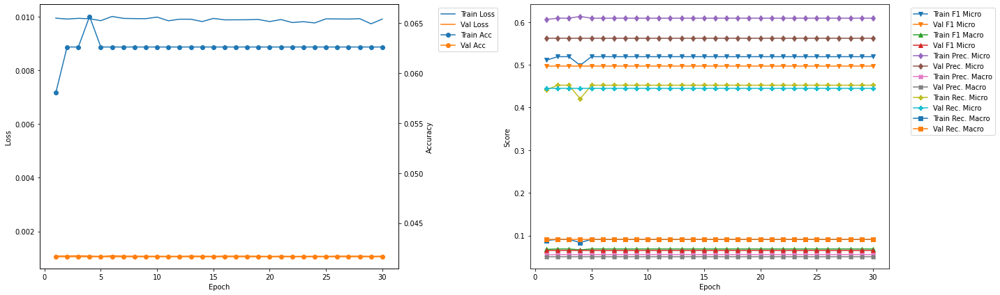

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.36
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5109 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4462 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.52
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.3989 	V

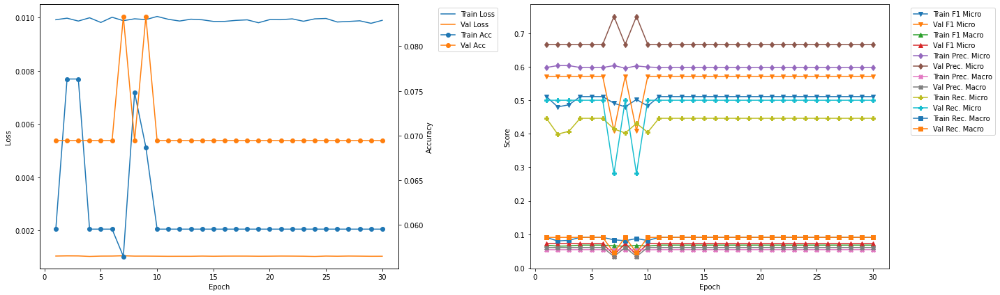

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0504 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.5749
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4456 	Validation Recall Micro: 0.5053
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909


In [22]:
resnet101LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0175 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

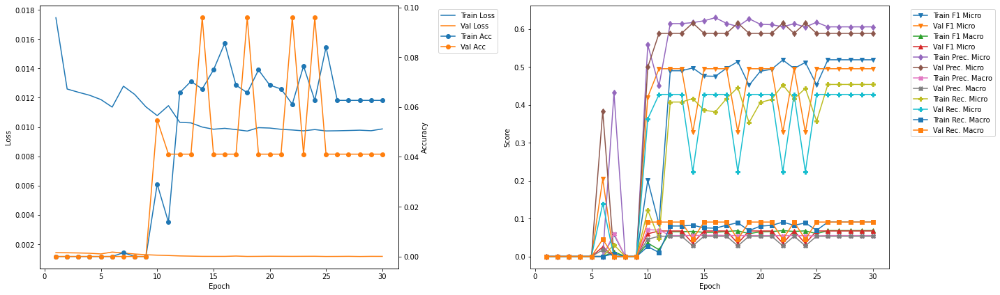

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.47
Train Loss: 0.013 	Validation Loss: 0.0016
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0858 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0193 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4278 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0588 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0477 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0127 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.61
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0024 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.08 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0036 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recal

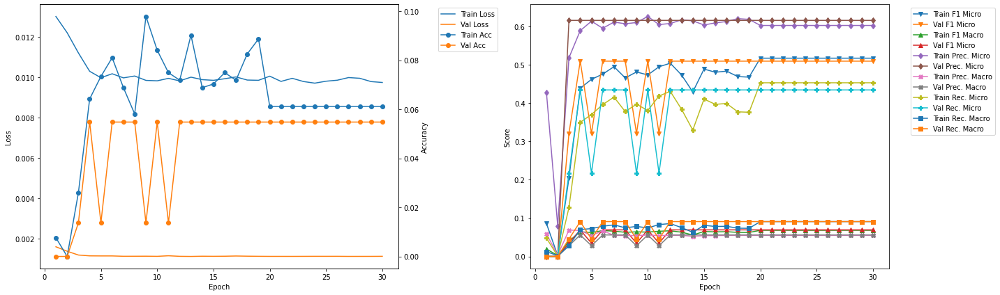

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.79
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.622 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.3828 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0749 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.94
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4795 	Validation F1 Micro: 0.4713
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.3954 	Validation Recall Micro

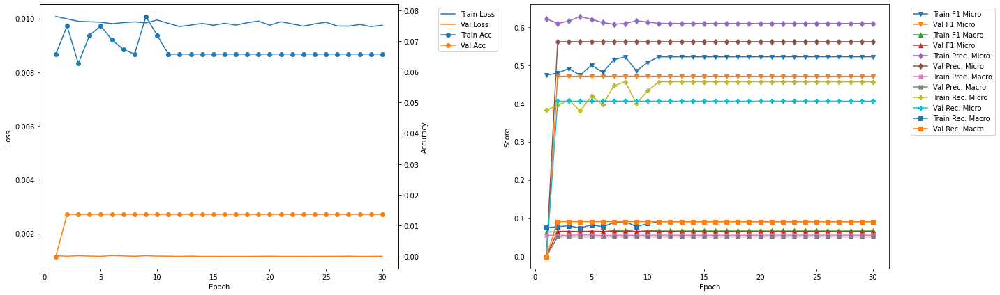

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.12
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.487
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0655
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4468 	Validation Recall Micro: 0.4221
Train Recall Marco: 0.0892 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.26
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.487
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0655
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4548

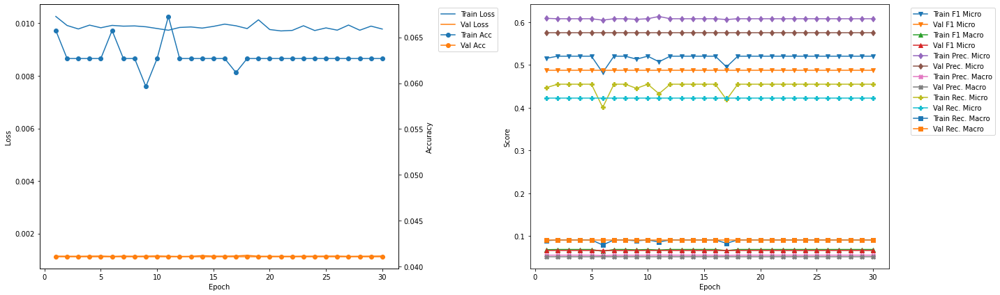

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.509915 --> 0.550898).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.44
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4059 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0823 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.59
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5062 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6301
Train Precis

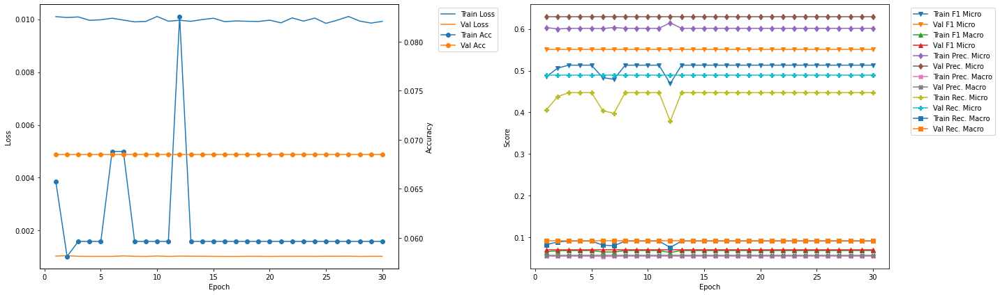

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.77
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4489 	Validation Recall Micro: 0.4757
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.91
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6108 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3927 	V

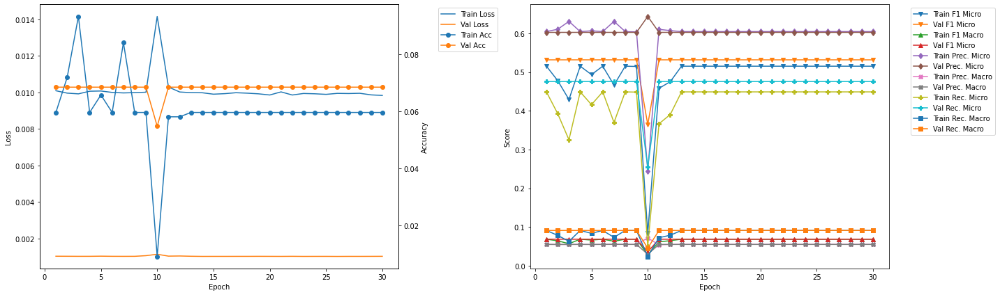

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4494 	Validation Recall Micro: 0.4719
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.24
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.503 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4268 	

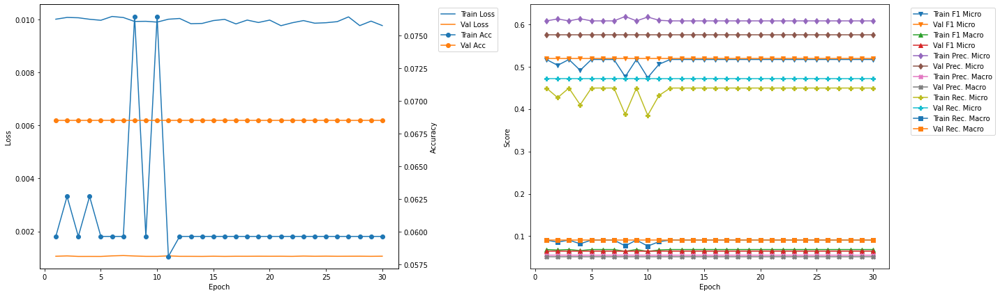

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.43
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5486
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4497 	Validation Recall Micro: 0.466
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.58
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5486
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.449

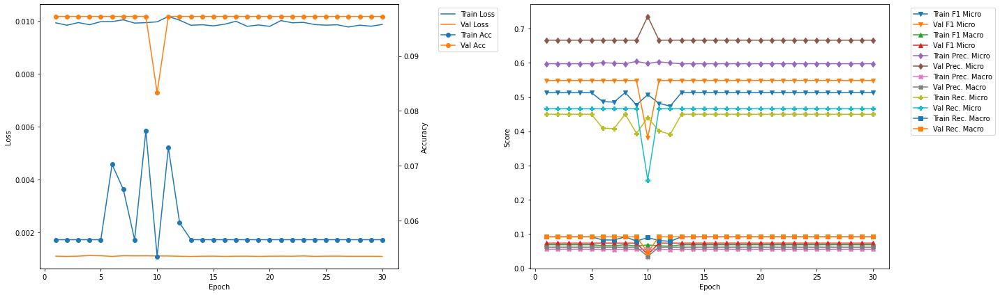

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.75
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0916 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4822 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6323 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0566 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3898 	Validation Recall Micro: 0.4652
Train Recall Marco: 0.0773 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.516 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.45 	Valid

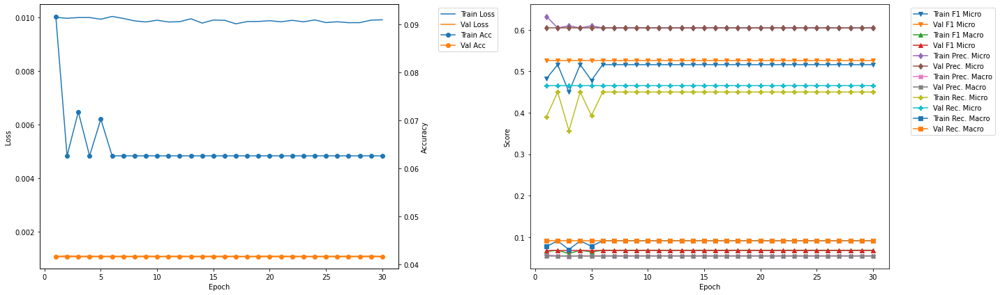

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.09
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5082 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4404 	Validation Recall Micro: 0.4639
Train Recall Marco: 0.0887 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.23
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4501 	Va

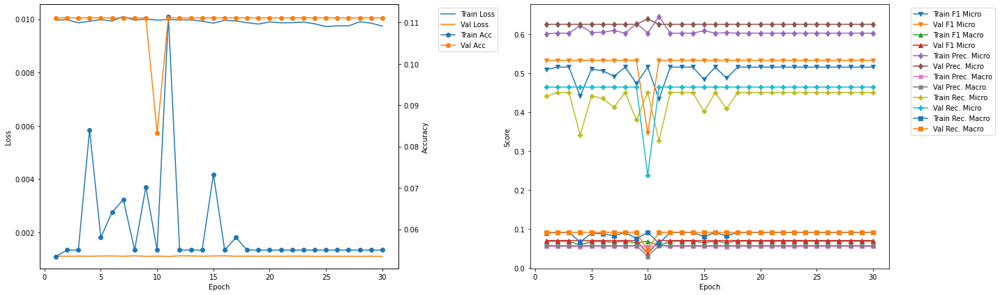

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4059 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0823 	Validation Recall Macro: 0.0909


In [23]:
densenet121LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0168 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.06 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0513 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1333 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0387 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0539 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

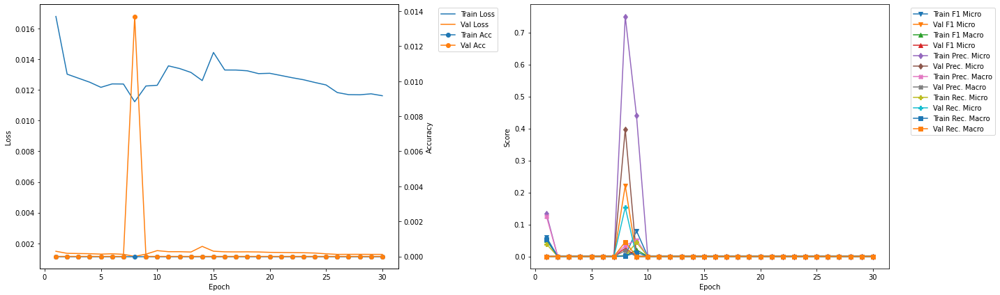

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.78
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.94
Train Loss: 0.0119 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

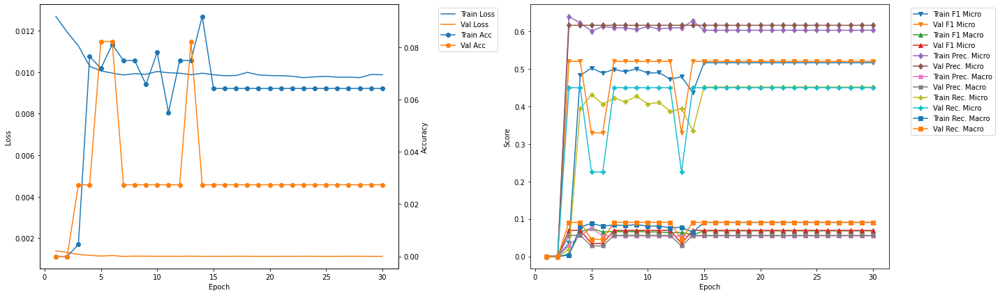

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.41
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4927 	Validation F1 Micro: 0.342
Train F1 Marco: 0.0738 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.075 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4158 	Validation Recall Micro: 0.2347
Train Recall Marco: 0.0845 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.520231 --> 0.520468).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.57
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4764 	Validation F1 Micro: 0.5205
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6096
Train Precision 

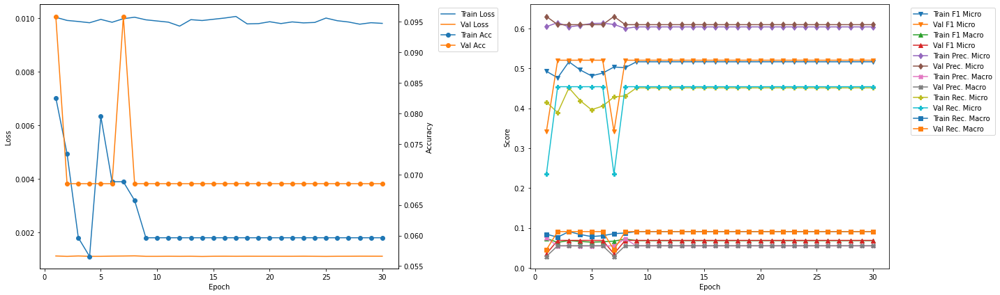

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.520468 --> 0.533333).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 14.04
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4831 	Validation F1 Micro: 0.5333
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4016 	Validation Recall Micro: 0.4623
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.2
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4846 	Validation F1 Micro: 0.5333
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6161 	Validation Precision Micro: 0.6301
Train Precisi

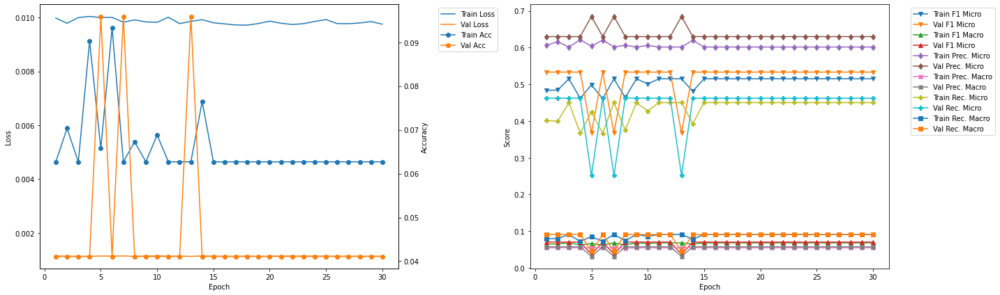

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.67
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.493 	Validation F1 Micro: 0.513
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4135 	Validation Recall Micro: 0.4428
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.82
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5174 	Validation F1 Micro: 0.513
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4525 	

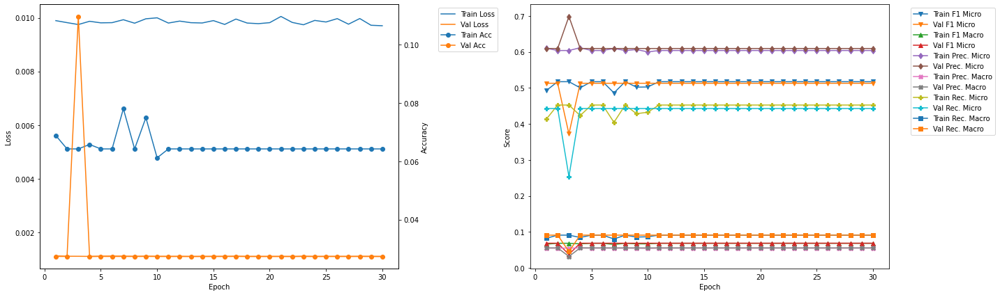

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.29
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4866 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4045 	Validation Recall Micro: 0.4472
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.45
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4926 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.41

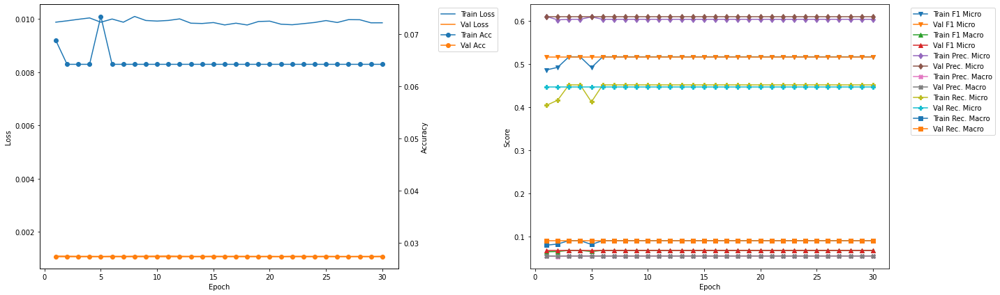

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.533333 --> 0.543807).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 27.93
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.055 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4183 	Validation Recall Micro: 0.4865
Train Recall Marco: 0.0842 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.08
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision 

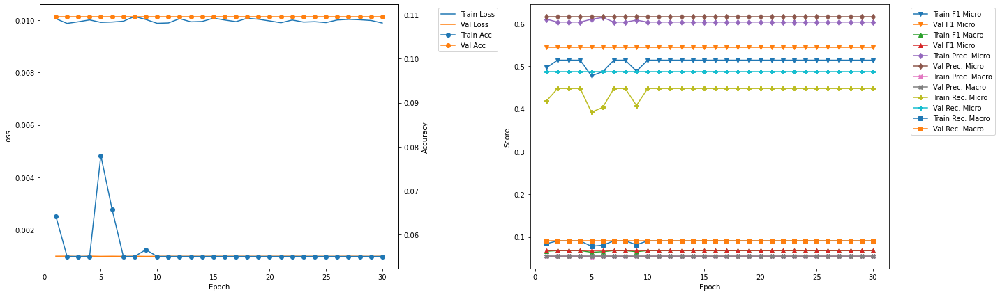

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.55
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.512 	Validation F1 Micro: 0.4667
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4355 	Validation Recall Micro: 0.414
Train Recall Marco: 0.0865 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.7
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.4667
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4554 	V

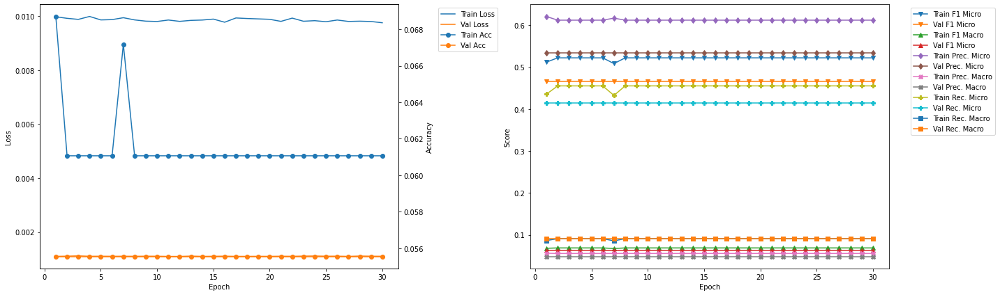

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.18
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0519 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5119 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4446 	Validation Recall Micro: 0.4363
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.33
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5175 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4532

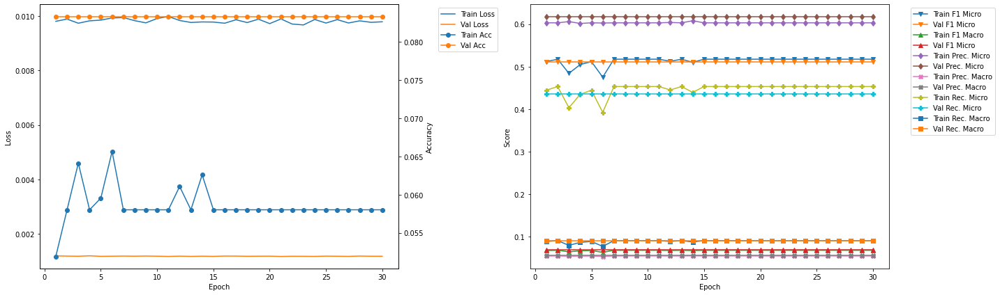

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.543807 --> 0.554217).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 41.81
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4144 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 41.97
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0534 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision 

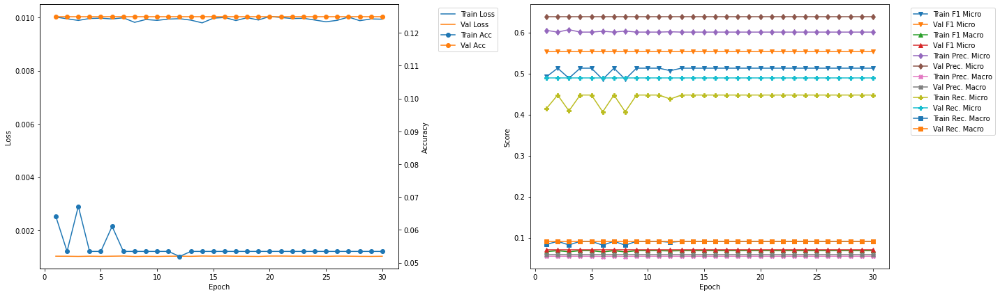

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4144 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0835 	Validation Recall Macro: 0.0909


In [24]:
densenet169LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0237 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0656 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0429 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1283 	Validation Precision Micro: 0.0
Train Precision Marco: 0.132 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.044 	Validation Recall Micro: 0.0
Train Recall Marco: 0.033 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

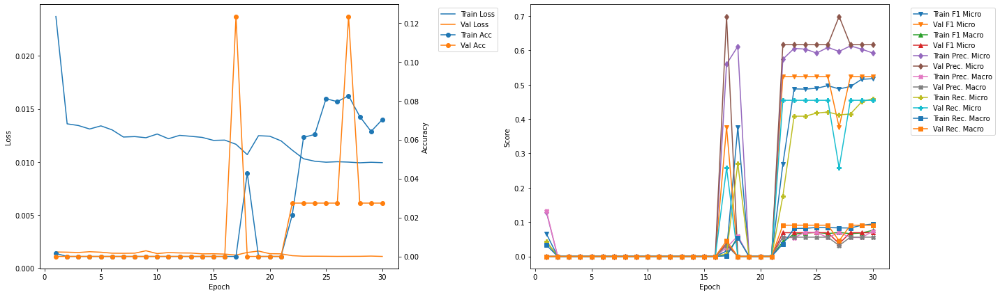

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.1
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.137
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.3741
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4087 	Validation Recall Micro: 0.2537
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.27
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4742 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6181 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3846 	Valid

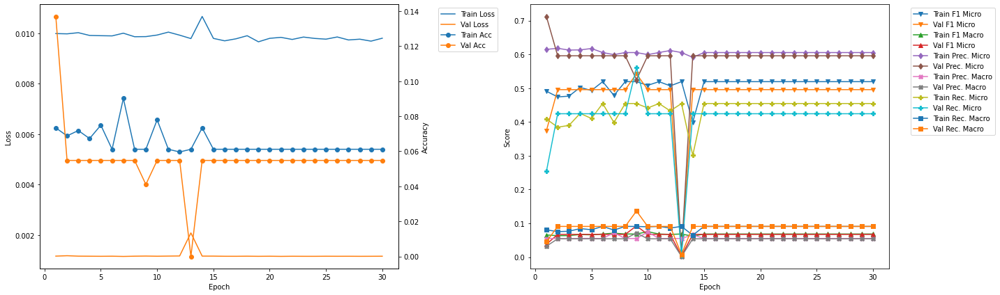

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.03
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0535 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4912 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6035 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4142 	Validation Recall Micro: 0.4813
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.2
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5143 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4483 	V

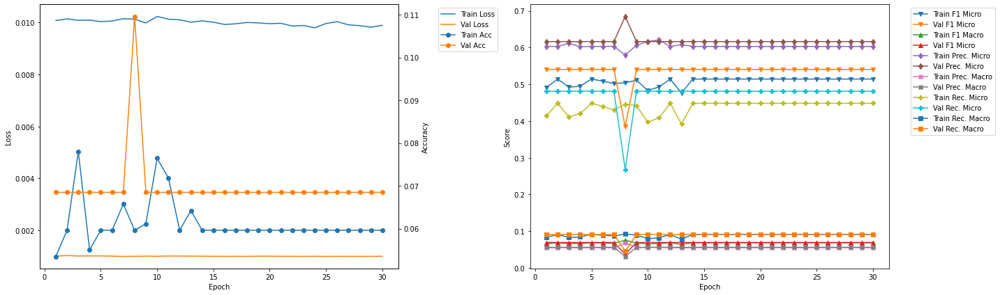

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.97
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5059 	Validation F1 Micro: 0.3116
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.6119 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.4312 	Validation Recall Micro: 0.2118
Train Recall Marco: 0.0857 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.13
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4913 	Validation F1 Micro: 0.3116
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.4117 

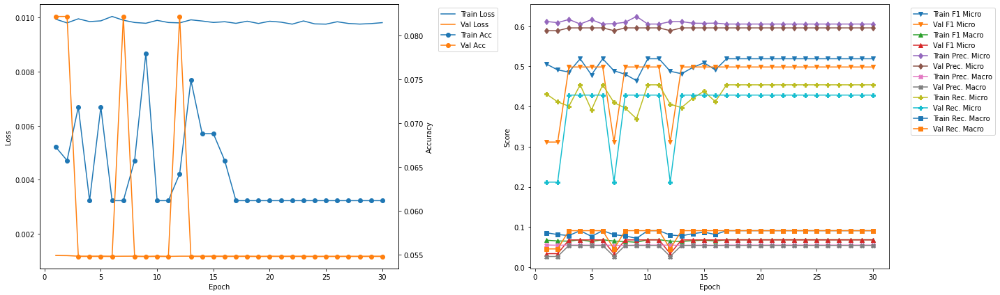

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.91
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5189 	Validation F1 Micro: 0.5199
Train F1 Marco: 0.0717 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0734 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4553 	Validation Recall Micro: 0.4696
Train Recall Marco: 0.0927 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.07
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.5199
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.38 	Val

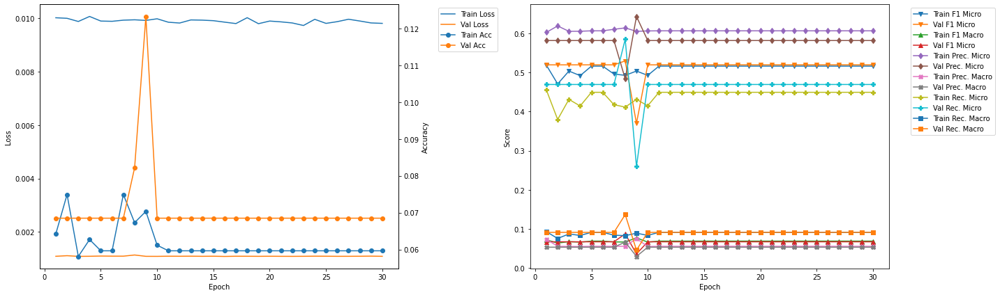

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.84
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.3782
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4264 	Validation Recall Micro: 0.2574
Train Recall Marco: 0.0855 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.497 	Validation F1 Micro: 0.5345
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4241 	V

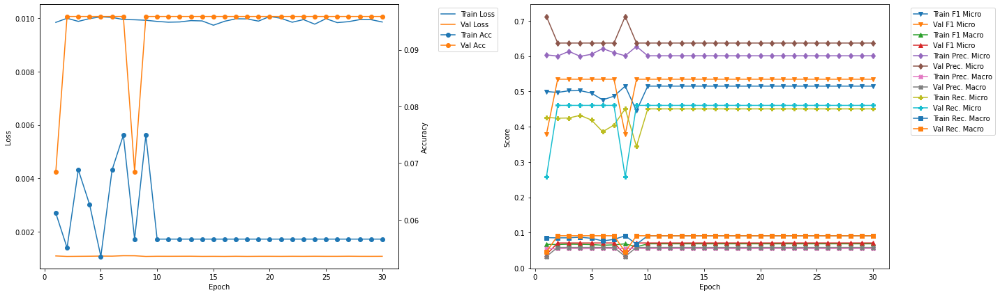

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.78
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4276 	Validation Recall Micro: 0.4493
Train Recall Marco: 0.0855 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5018 	Validation F1 Micro: 0.3714
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4287 	Va

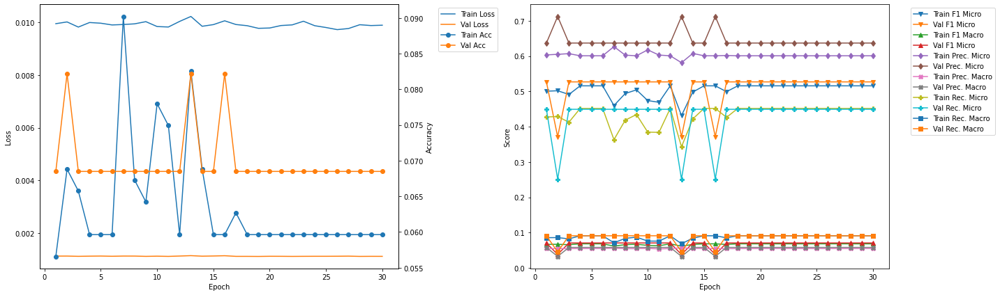

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.72
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5012 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4234 	Validation Recall Micro: 0.4531
Train Recall Marco: 0.0847 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.89
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4513 	Vali

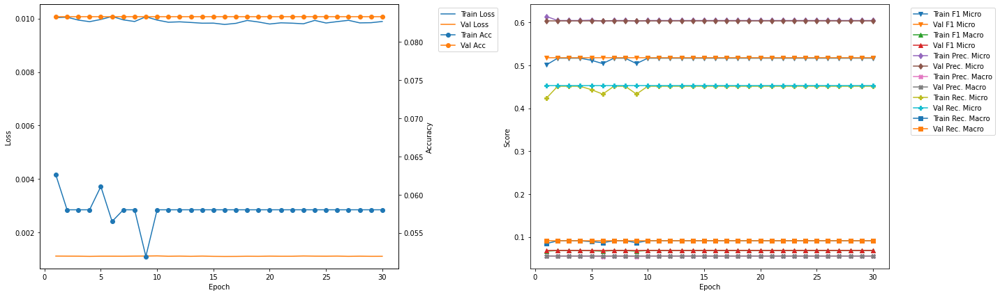

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5092 	Validation F1 Micro: 0.5357
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.441 	Validation Recall Micro: 0.4688
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.82
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4683 	Validation F1 Micro: 0.5357
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3789 	Va

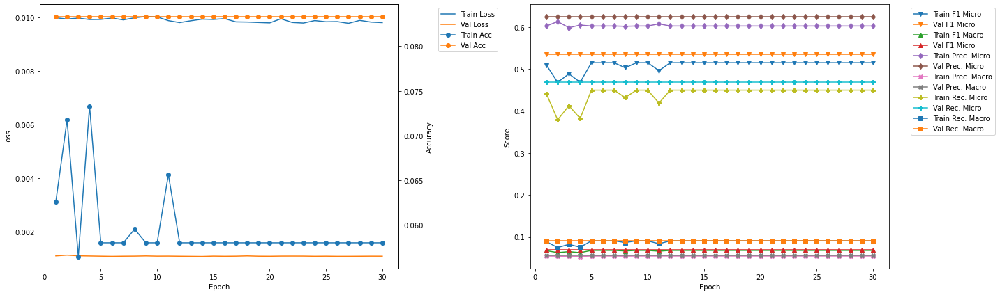

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.6
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0
Train F1 Mirco: 0.502 	Validation F1 Micro: 0.4753
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0633
Train Precision Mirco: 0.6253 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0562 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4194 	Validation Recall Micro: 0.4278
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.76
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5213 	Validation F1 Micro: 0.3016
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0314
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.024
Train Recall Mirco: 0.4539 	V

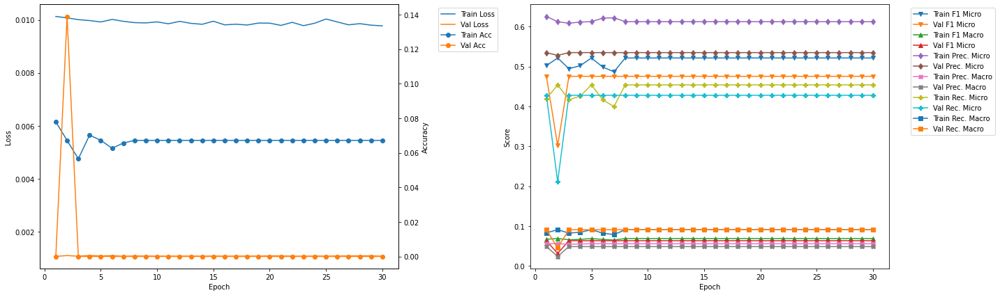

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 9
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5193 	Validation F1 Micro: 0.5425
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0925
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5251
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0716
Train Recall Mirco: 0.4546 	Validation Recall Micro: 0.561
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.1364


In [25]:
densenet201LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0173 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0378 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0155 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2368 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0687 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0205 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0097 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

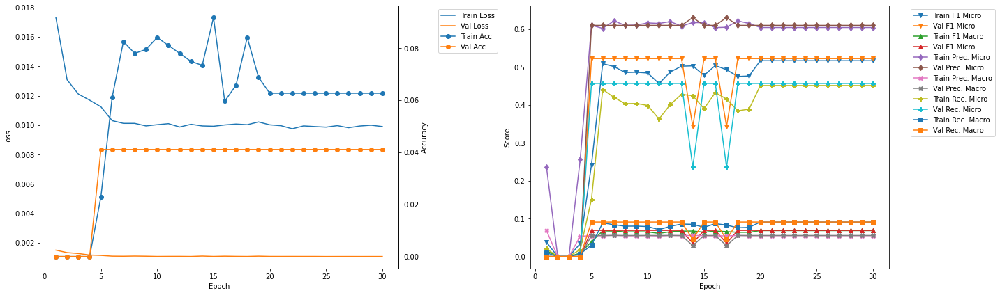

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.85
Train Loss: 0.0101 	Validation Loss: 0.0013
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4574 	Validation F1 Micro: 0.3441
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0589 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.3672 	Validation Recall Micro: 0.2319
Train Recall Marco: 0.0738 	Validation Recall Macro: 0.0445

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.04
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4624 	Validation F1 Micro: 0.5099
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.5907 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0605 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3799 

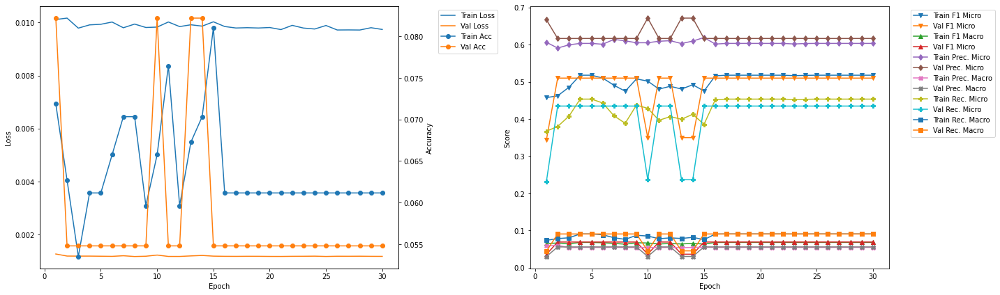

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.5
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.5108
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3931 	Validation Recall Micro: 0.4637
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.69
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5139 	Validation F1 Micro: 0.3651
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4429 	Vali

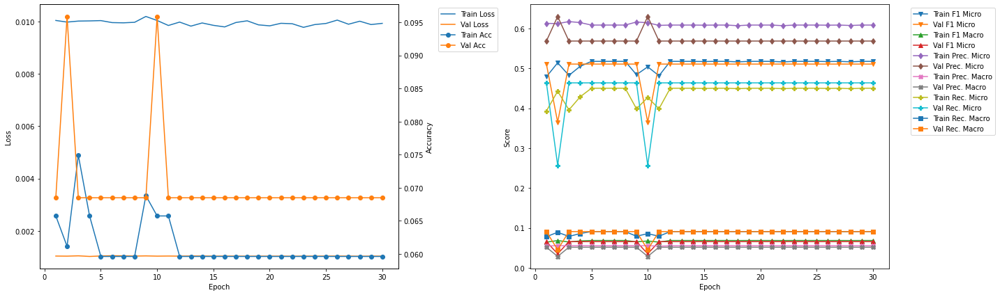

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.521994 --> 0.542773).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.16
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4801 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3962 	Validation Recall Micro: 0.4767
Train Recall Marco: 0.0791 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.35
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4916 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6301
Train Precision 

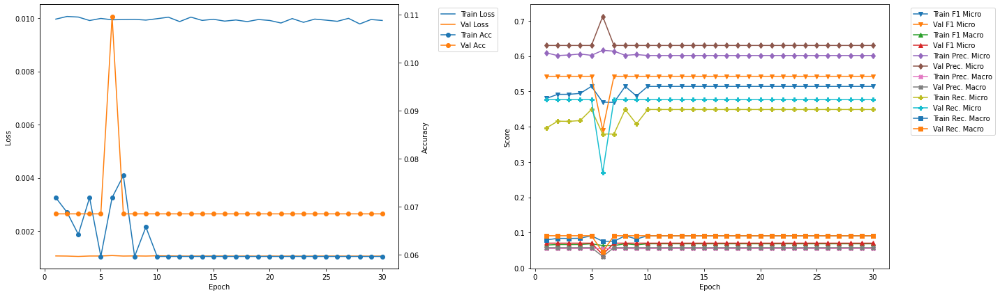

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0933 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.48 	Validation F1 Micro: 0.365
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0434
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6494
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0741
Train Recall Mirco: 0.3949 	Validation Recall Micro: 0.2538
Train Recall Marco: 0.0778 	Validation Recall Macro: 0.05

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.0
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.489 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4063 	Validatio

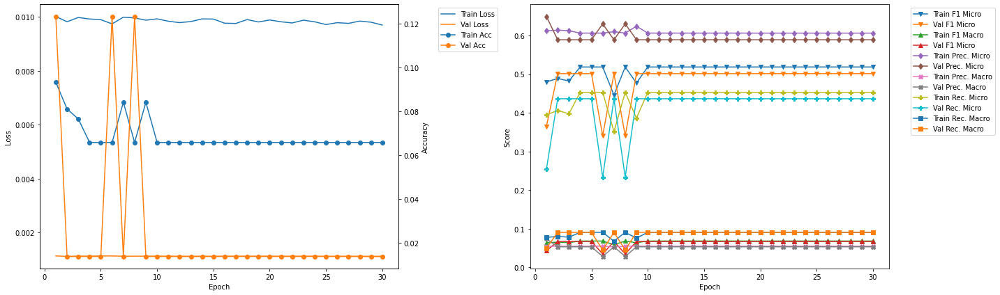

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.46
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4971 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.0732 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0716 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4243 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0858 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.65
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4775 	Validation F1 Micro: 0.4986
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.387 	V

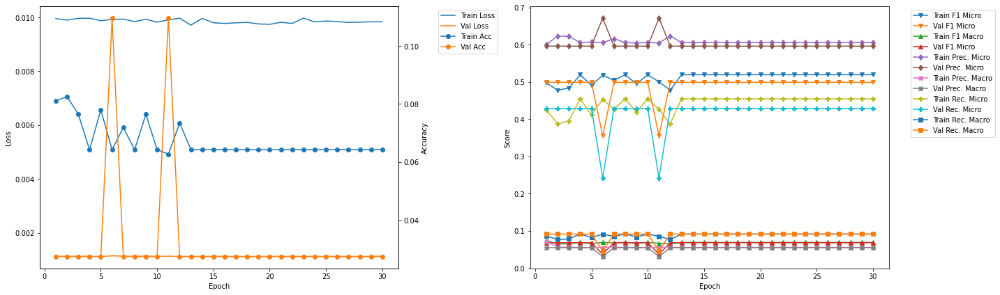

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.5116
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4277 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.29
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.476 	Validation F1 Micro: 0.5116
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6223 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3854 	V

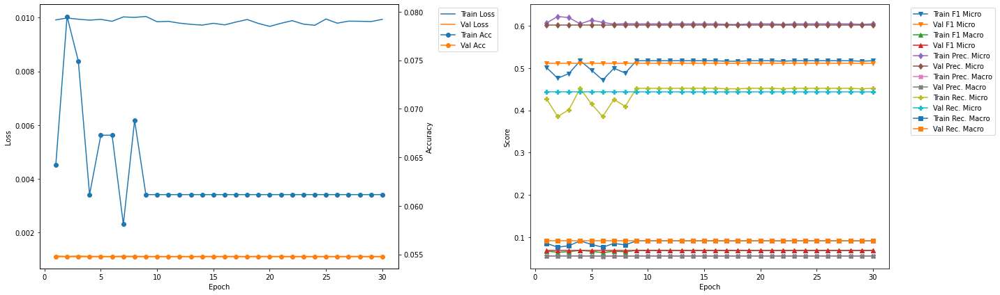

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.75
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5003 	Validation F1 Micro: 0.3629
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.425 	Validation Recall Micro: 0.2513
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.94
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0519 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5032 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0825
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5931
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0995
Train Recall Mirco: 0.427

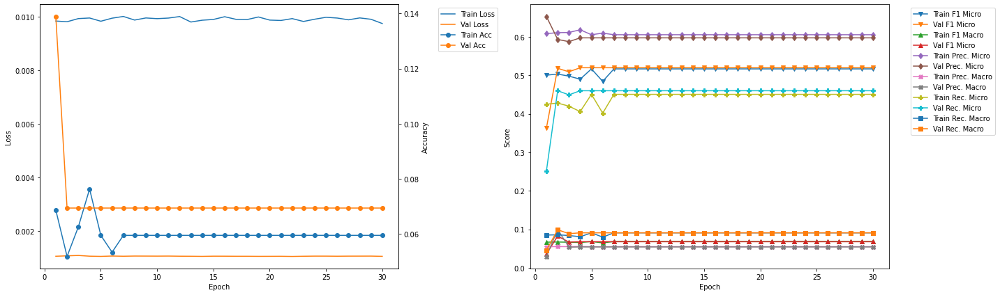

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.39
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0504 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4492 	Validation Recall Micro: 0.4718
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.58
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0504 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.514 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4492

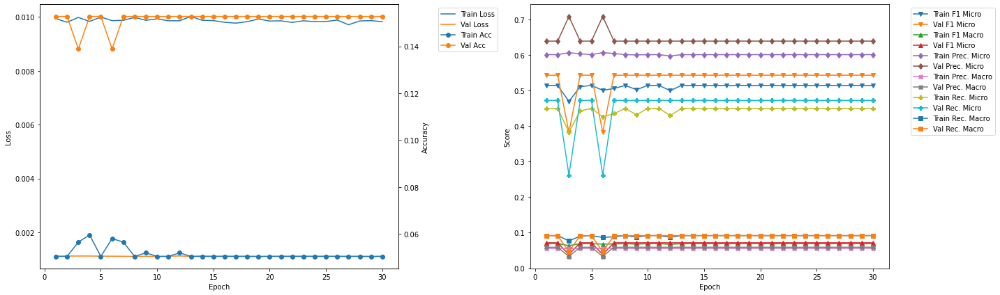

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.04
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4953 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4185 	Validation Recall Micro: 0.4456
Train Recall Marco: 0.0834 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.22
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5176 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.45

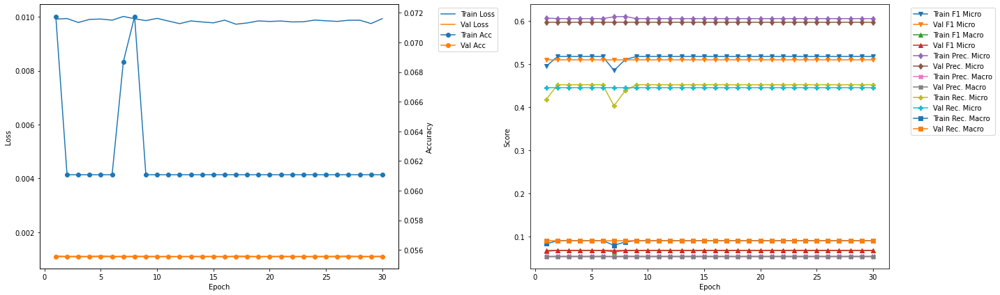

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4801 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3962 	Validation Recall Micro: 0.4767
Train Recall Marco: 0.0791 	Validation Recall Macro: 0.0909


In [26]:
vgg11bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0151 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0517 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0345 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1486 	Validation Precision Micro: 0.0
Train Precision Marco: 0.102 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0313 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0295 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.508982).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0119 	Validation Loss: 0.0011
Train Accuracy: 0.0046 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.0696 	Validation F1 Micro: 0.509
Train F1 Marco: 0.013 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6019 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0547 	Validatio

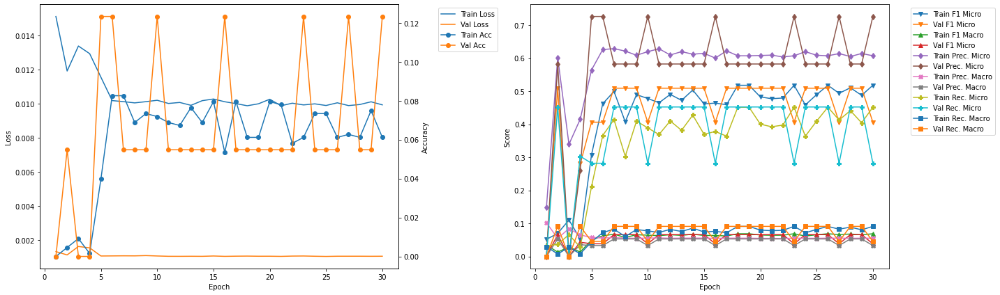

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.508982 --> 0.513433).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.29
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.43 	Validation F1 Micro: 0.5134
Train F1 Marco: 0.071 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.5808 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0671 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3413 	Validation Recall Micro: 0.455
Train Recall Marco: 0.077 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.5
Train Loss: 0.0116 	Validation Loss: 0.0015
Train Accuracy: 0.0566 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3837 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0571 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5778 	Validation Precision Micro: 0.0
Train Precision Marco: 0.057 	Va

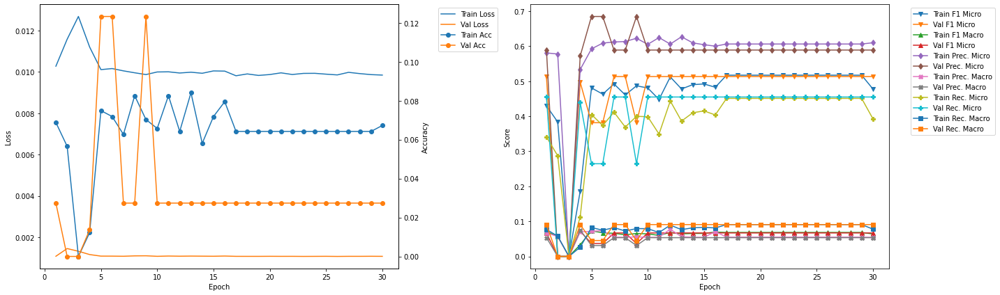

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.35
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4812 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6191 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3936 	Validation Recall Micro: 0.4363
Train Recall Marco: 0.0775 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.55
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4907 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.071 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4154 

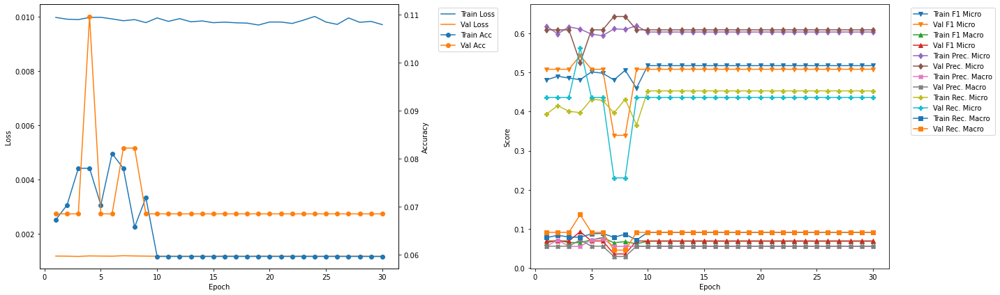

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.543735 --> 0.583090).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.44
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4787 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.5801 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0691 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.4074 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.64
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4807 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.5959 	Validation Precision Micro: 0.6849
Train Precis

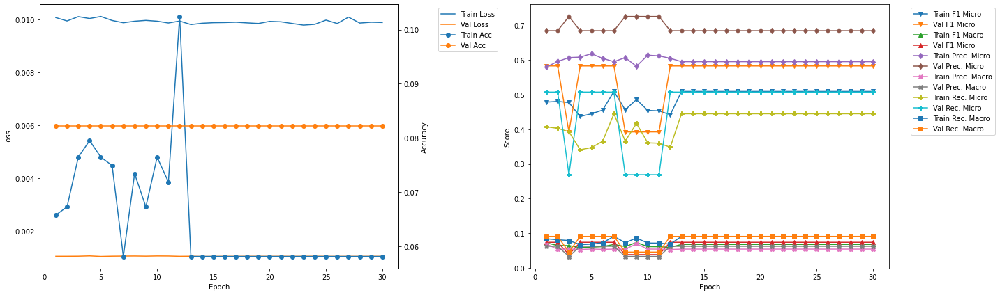

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.49
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4879 	Validation F1 Micro: 0.5378
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4067 	Validation Recall Micro: 0.455
Train Recall Marco: 0.0809 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.69
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.5378
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4003 

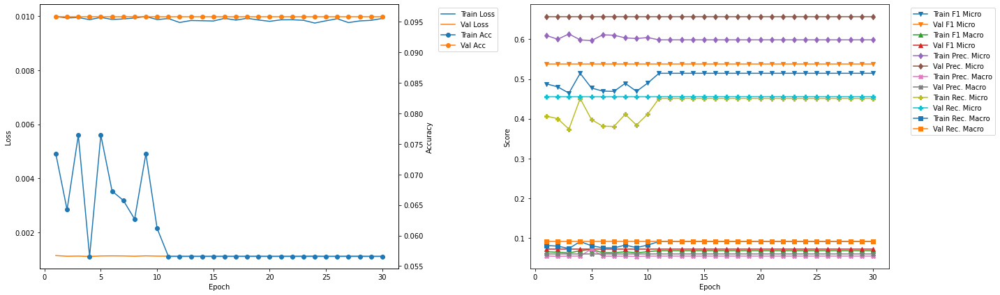

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.54
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.508 	Validation F1 Micro: 0.3381
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6057 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4374 	Validation Recall Micro: 0.2293
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.74
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0887 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4438 	Validation F1 Micro: 0.5128
Train F1 Marco: 0.059 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6476 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0573 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3375 	V

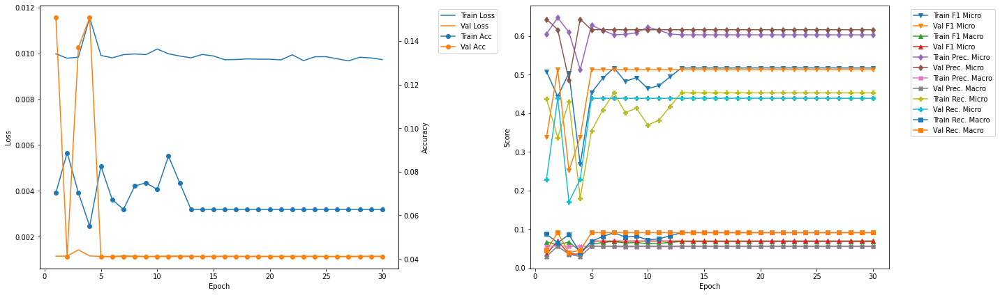

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.59
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5228 	Validation F1 Micro: 0.4805
Train F1 Marco: 0.0736 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6001 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0701 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4631 	Validation Recall Micro: 0.4278
Train Recall Marco: 0.0938 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.79
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4805
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.454 

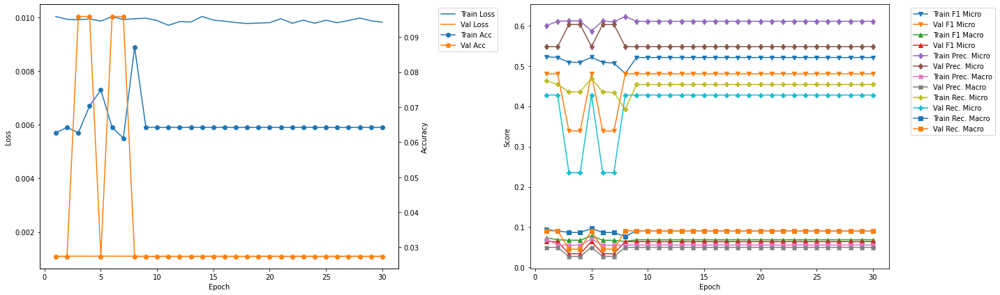

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.64
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4792 	Validation F1 Micro: 0.5441
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0894
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.5
Train Precision Marco: 0.0667 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.4003 	Validation Recall Micro: 0.5967
Train Recall Marco: 0.08 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.84
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5179 	Validation F1 Micro: 0.5108
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.068 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.4547 	Val

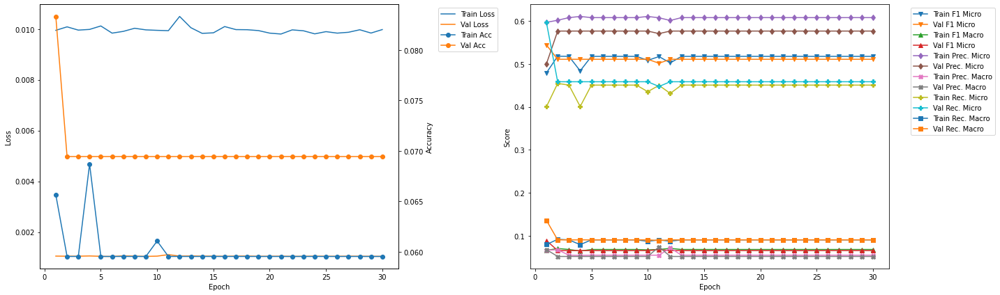

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.68
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.52 	Validation F1 Micro: 0.3134
Train F1 Marco: 0.0712 	Validation F1 Macro: 0.0335
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0715 	Validation Precision Macro: 0.0265
Train Recall Mirco: 0.4575 	Validation Recall Micro: 0.2143
Train Recall Marco: 0.0921 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.88
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0718 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.3134
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0335
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0265
Train Recall Mirco: 0.3969

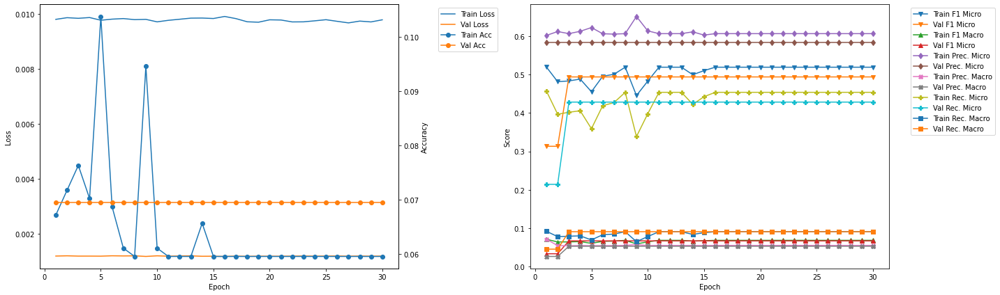

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.72
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5169 	Validation F1 Micro: 0.5165
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6053 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4511 	Validation Recall Micro: 0.455
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4874 	Validation F1 Micro: 0.5165
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6211 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.401

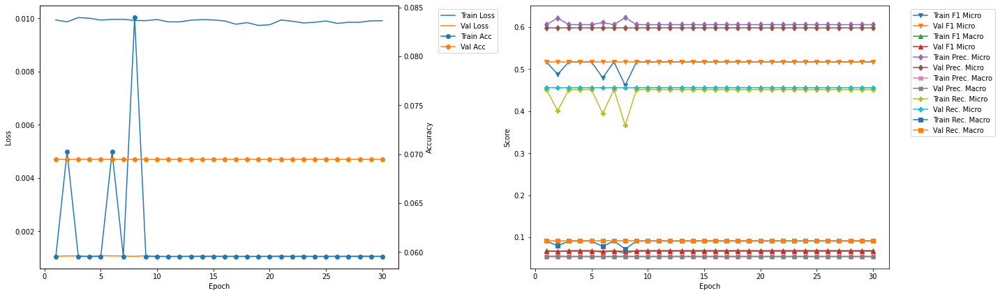

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4787 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0738
Train Precision Mirco: 0.5801 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0691 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.4074 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909


In [27]:
vgg16bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0154 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.056 	Validation F1 Micro: 0.0
Train F1 Marco: 0.038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1063 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0783 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.038 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0491 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

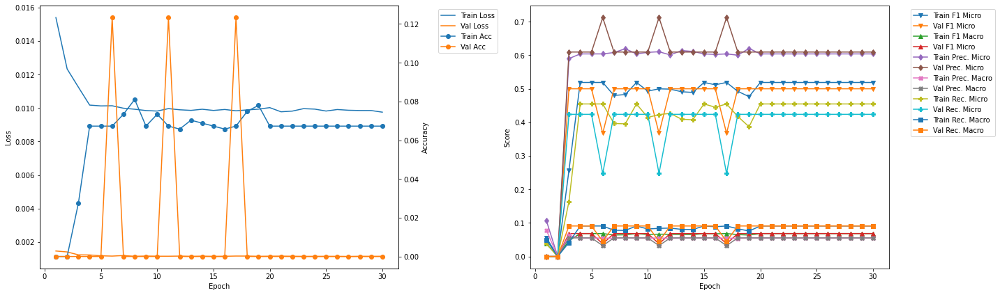

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.500000 --> 0.514970).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.52
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5012 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0755 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0851 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4298 	Validation Recall Micro: 0.4574
Train Recall Marco: 0.0917 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.73
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4928 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.5982 	Validation Precision Micro: 0.589
Train Precision Ma

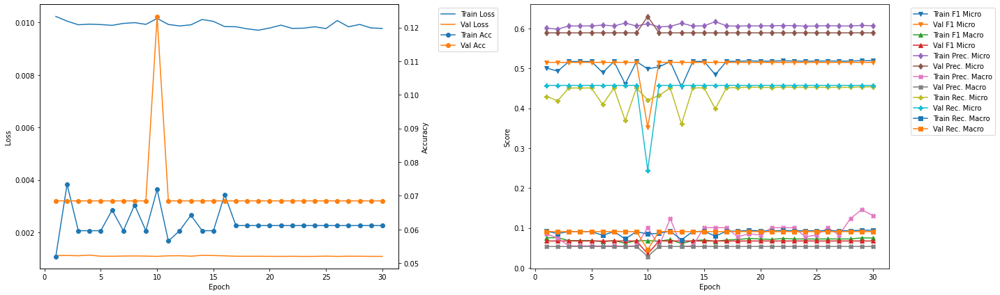

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.79
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5216 	Validation F1 Micro: 0.494
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0933 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4554 	Validation Recall Micro: 0.4409
Train Recall Marco: 0.0944 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.0
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5107 	Validation F1 Micro: 0.494
Train F1 Marco: 0.0758 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0841 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4395 

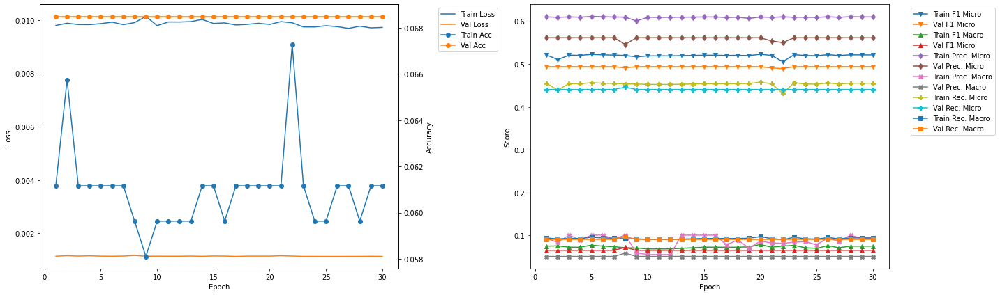

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.06
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5207 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0764 	Validation F1 Macro: 0.0744
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.585
Train Precision Marco: 0.0893 	Validation Precision Macro: 0.0984
Train Recall Mirco: 0.4553 	Validation Recall Micro: 0.4526
Train Recall Marco: 0.0954 	Validation Recall Macro: 0.095

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.27
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.52 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4548 	Vali

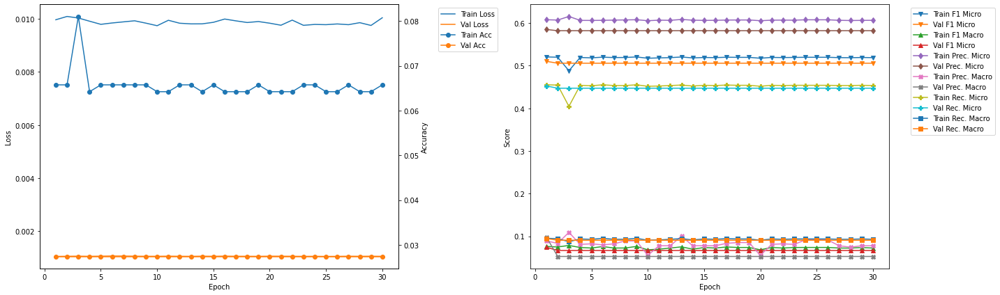

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.514970 --> 0.528090).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 25.36
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4822 	Validation F1 Micro: 0.5281
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0654 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4024 	Validation Recall Micro: 0.4476
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.57
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5281
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6438
Train Precisi

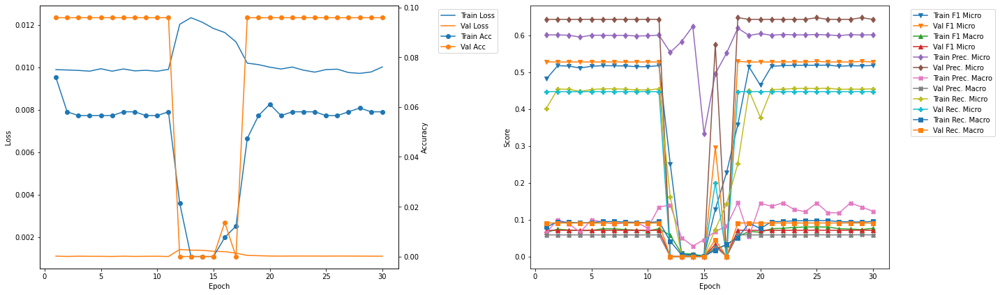

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.529577 --> 0.537037).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 31.72
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0505 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4631 	Validation F1 Micro: 0.537
Train F1 Marco: 0.074 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.5918
Train Precision Marco: 0.1344 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.378 	Validation Recall Micro: 0.4915
Train Recall Marco: 0.0801 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.537037 --> 0.538700).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.95
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4682 	Validation F1 Micro: 0.5387
Train F1 Marco: 0.0787 	Validation F1 Macro: 0.0677
Trai

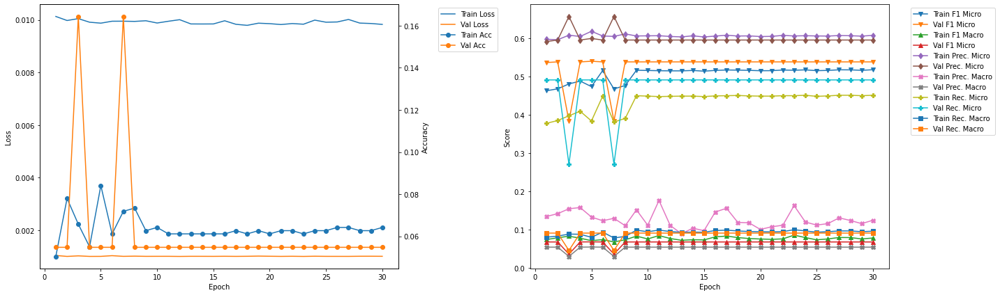

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.540373 --> 0.559524).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 38.06
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4834 	Validation F1 Micro: 0.5595
Train F1 Marco: 0.0807 	Validation F1 Macro: 0.0835
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1428 	Validation Precision Macro: 0.1037
Train Recall Mirco: 0.3984 	Validation Recall Micro: 0.4947
Train Recall Marco: 0.0849 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.27
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4903 	Validation F1 Micro: 0.4326
Train F1 Marco: 0.0855 	Validation F1 Macro: 0.0798
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.663
Train Precision Ma

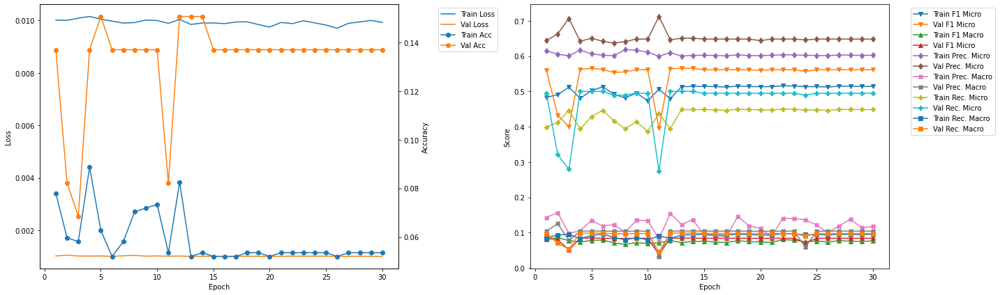

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.37
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.5449
Train F1 Marco: 0.0749 	Validation F1 Macro: 0.0963
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.6483
Train Precision Marco: 0.1385 	Validation Precision Macro: 0.1494
Train Recall Mirco: 0.4121 	Validation Recall Micro: 0.47
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.1057

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.58
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0824 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4674 	Validation F1 Micro: 0.5391
Train F1 Marco: 0.071 	Validation F1 Macro: 0.0859
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.6414
Train Precision Marco: 0.1228 	Validation Precision Macro: 0.1035
Train Recall Mirco: 0.3761 	Va

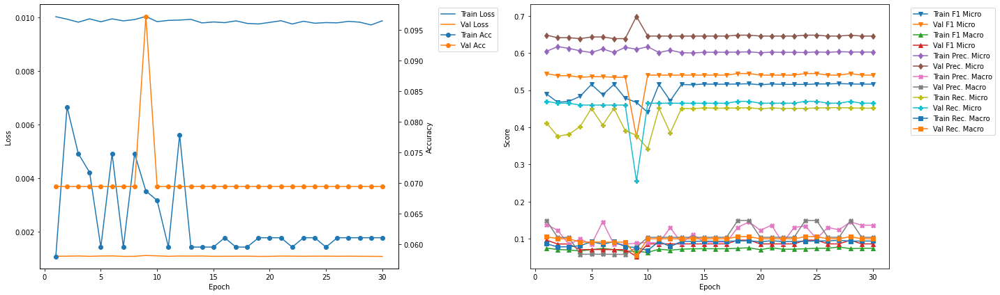

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.64
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5193 	Validation F1 Micro: 0.3858
Train F1 Marco: 0.0763 	Validation F1 Macro: 0.0561
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.6622
Train Precision Marco: 0.1462 	Validation Precision Macro: 0.0751
Train Recall Mirco: 0.4522 	Validation Recall Micro: 0.2722
Train Recall Marco: 0.0948 	Validation Recall Macro: 0.0584

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.85
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.526
Train F1 Marco: 0.073 	Validation F1 Macro: 0.0947
Train Precision Mirco: 0.6174 	Validation Precision Micro: 0.585
Train Precision Marco: 0.0894 	Validation Precision Macro: 0.1209
Train Recall Mirco: 0.4063 	

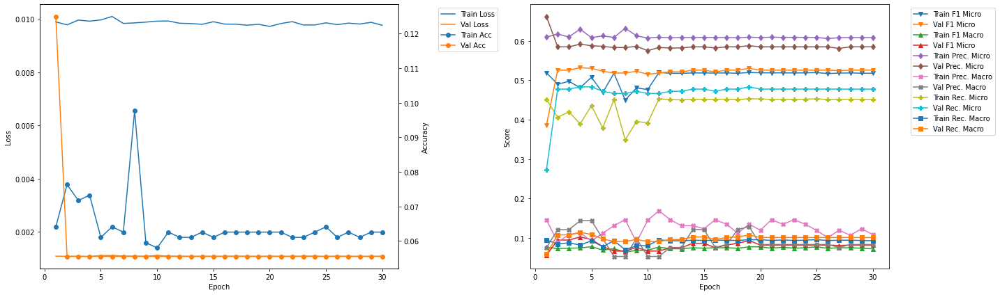

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.91
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0809 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.4875
Train F1 Marco: 0.0729 	Validation F1 Macro: 0.0872
Train Precision Mirco: 0.6193 	Validation Precision Micro: 0.6069
Train Precision Marco: 0.108 	Validation Precision Macro: 0.0887
Train Recall Mirco: 0.4183 	Validation Recall Micro: 0.4074
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.1033

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.12
Train Loss: 0.0096 	Validation Loss: 0.0013
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.4917
Train F1 Marco: 0.0693 	Validation F1 Macro: 0.0919
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1004 	Validation Precision Macro: 0.091
Train Recall Mirco: 0.45 

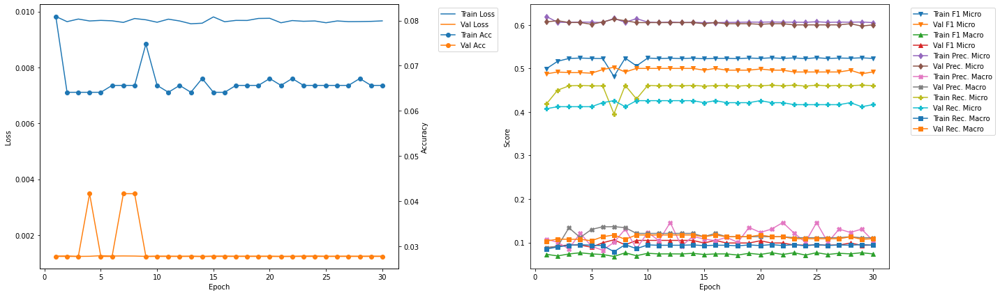

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 5
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5022 	Validation F1 Micro: 0.5655
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0843
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.1341 	Validation Precision Macro: 0.1043
Train Recall Mirco: 0.4286 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0917 	Validation Recall Macro: 0.0985


In [28]:
vgg19bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_0')

In [29]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:27:03


## Training Summary

### Summary Table

In [30]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_0_best,
    'ResNet50' : resnet50LSTM_500_1_0_best,
    'ResNet101' : resnet101LSTM_500_1_0_best,
    'DenseNet121' : densenet121LSTM_500_1_0_best,
    'DenseNet169' : densenet169LSTM_500_1_0_best,
    'DenseNet201' : densenet201LSTM_500_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,2.000000,3.000000,8.000000,5.000000,10.000000,2.000000,4.000000,4.000000,7.000000
Epoch,3.000000,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,1.000000,5.000000
Train Loss,0.010304,0.010136,0.009981,0.010098,0.010014,0.009868,0.009966,0.010077,0.010044
Train Accuracy,0.067278,0.065749,0.050382,0.065749,0.064122,0.061162,0.071865,0.065749,0.062691
Train F1 Micro,0.443303,0.473810,0.510597,0.485384,0.491903,0.519344,0.480138,0.478684,0.502167
Train F1 Macro,0.060328,0.064162,0.067813,0.065674,0.065947,0.068431,0.064534,0.072261,0.077704
Train Precision Micro,0.614446,0.597582,0.597710,0.603550,0.604979,0.605505,0.609115,0.580146,0.606280
Train Precision Macro,0.054479,0.053832,0.054337,0.054756,0.054511,0.055046,0.054549,0.069116,0.134143
Train Recall Micro,0.346728,0.392513,0.445646,0.405912,0.414440,0.454650,0.396237,0.407429,0.428571
Train Recall Macro,0.068211,0.079403,0.090909,0.082285,0.083462,0.090909,0.079096,0.083943,0.091668


### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

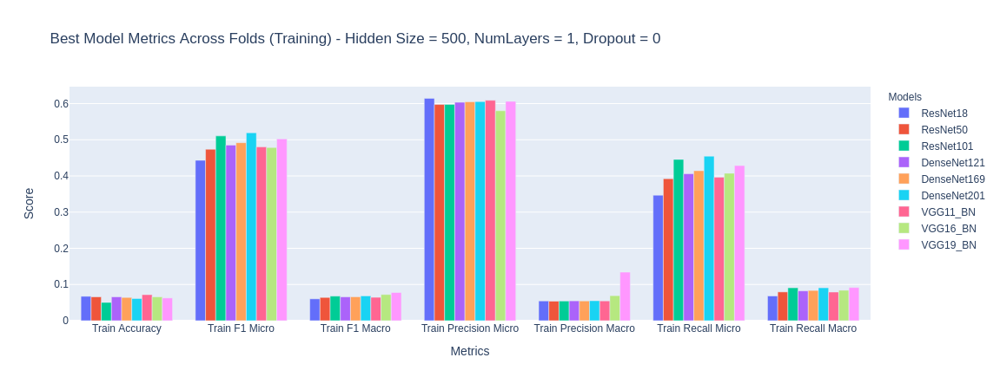

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

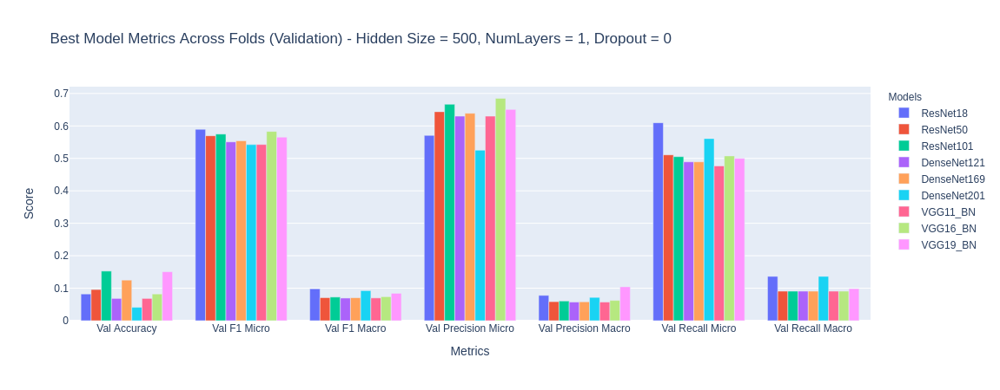

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()